# Task 3 NLP

## Importing required Libraries


In [1]:
import pandas as pd
import numpy as np
import nltk
import re
from tqdm import tqdm
import spacy
from spacy.lang.en import English
from spacy.lang.en.stop_words import STOP_WORDS
import contractions
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.preprocessing import LabelEncoder
from sklearn import model_selection
from sklearn.metrics import f1_score
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import PCA
import joblib
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import normalize
from sklearn.naive_bayes import MultinomialNB
from keras.models import Sequential
from keras.layers import Dense
from keras.utils import to_categorical
from keras.callbacks import ModelCheckpoint
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from keras.models import load_model
from nltk.stem.snowball import SnowballStemmer
from sklearn.decomposition import TruncatedSVD
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
import warnings
warnings.filterwarnings('ignore')
from hyperopt import hp,fmin,tpe,STATUS_OK,Trials
from sklearn.model_selection import cross_val_score
from keras.preprocessing import sequence
from keras.layers import *

## Loading the training dataset as Dataframe

In [ ]:
df = pd.read_csv('train.csv')

## Exploring the Data

**Random Sampling 5 different rows from the table**


In [ ]:
df.sample(5)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
15008,18e68010fbf85f7dc6b248ba21a150f0,2015-12-12 11:46:53 +0000,http://www.flipkart.com/luba-g58-stylo-analog-...,LUBA g58 Stylo Analog Watch - For Men,"[""Watches >> Wrist Watches >> LUBA Wrist Watch...",WATE9MXPZEEPXGAU,700.0,275.0,"[""http://img6a.flixcart.com/image/watch/g/a/u/...",False,LUBA g58 Stylo Analog Watch - For Men - Buy L...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Chronograp..."
19962,725fb81399c181c86be89675429b8d27,2015-12-01 10:15:43 +0000,http://www.flipkart.com/stylistry-women-heels/...,Stylistry Women Heels,"[""Footwear >> Women's Footwear >> Heels""]",SNDEF3R3VB55PJBX,1799.0,499.0,"[""http://img6a.flixcart.com/image/sandal/z/s/2...",False,Flipkart.com: Buy Stylistry Women Heels only f...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Occasion"",..."
7689,c666e51ec698f56a304d5fd9c1687229,2016-03-07 04:40:26 +0000,http://www.flipkart.com/aw-high-speed-charge-s...,AW High Speed Charge and Sync Usb for Iphone 6...,"[""Mobiles & Accessories >> Mobile Accessories ...",ACCEGKTSGJEEVTZ4,499.0,271.0,"[""http://img6a.flixcart.com/image/data-cable/l...",False,Key Features of AW High Speed Charge and Sync ...,No rating available,No rating available,AW,"{""product_specification""=>[{""key""=>""Sales Pack..."
4797,e6d2c55d12f6cac9b28c869df445c29e,2015-12-01 12:40:44 +0000,http://www.flipkart.com/black-diamond-non-stic...,Black Diamond Non Stick Kadhai with SS Lid 24....,"[""Kitchen & Dining >> Cookware >> Pots & Pans ...",PTPDVPEXSVAC5GK7,1180.0,849.0,"[""http://img6a.flixcart.com/image/pot-pan/g/k/...",False,Buy Black Diamond Non Stick Kadhai with SS Lid...,No rating available,No rating available,Black Diamond,"{""product_specification""=>[{""key""=>""Non-stick""..."
11529,1d738bfa64cb70e5f255f2a299d52089,2015-12-31 09:19:31 +0000,http://www.flipkart.com/life-shoppers-stop-geo...,Life by Shoppers Stop Geometric Print V-neck C...,"[""Clothing >> Men's Clothing >> Winter & Seaso...",SWTE7V5K6JAMTFZQ,1299.0,779.0,"[""http://img6a.flixcart.com/image/sweater/z/z/...",True,Life by Shoppers Stop Geometric Print V-neck C...,5,5,NaN,"{""product_specification""=>[{""key""=>""Sleeve"", ""..."


**Checking the Dataframe Shape**

In [ ]:
df.shape

(20000, 15)

**Checking for all the columns given in the Dataframe**

In [ ]:
df.columns

Index(['uniq_id', 'crawl_timestamp', 'product_url', 'product_name',
       'product_category_tree', 'pid', 'retail_price', 'discounted_price',
       'image', 'is_FK_Advantage_product', 'description', 'product_rating',
       'overall_rating', 'brand', 'product_specifications'],
      dtype='object')

**Wasn't able to find the target variable in the table looking in particular columns where we can extract target variable from**

In [ ]:
for i in range(len(df)):
    print(df.loc[i,'product_category_tree'])

In [ ]:
df.loc[191,'product_category_tree']

'["Footwear >> Women\'s Footwear >> Casual Shoes >> Boots"]'

In [ ]:
df.loc[5,'product_category_tree']

["Eternal Gandhi Super Series Crystal Paper Weight..."]


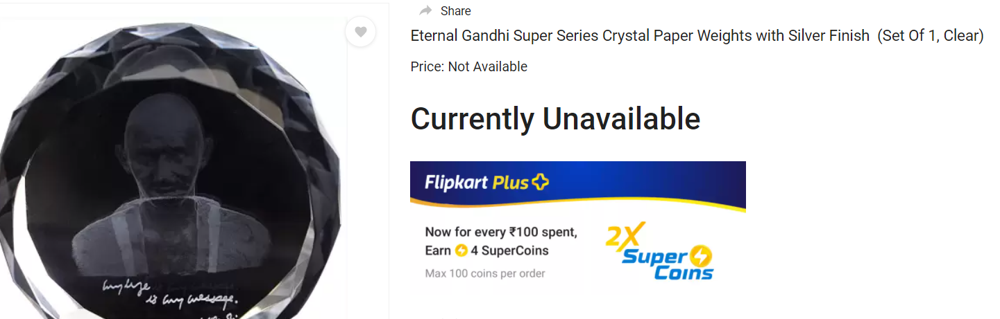

**Findings:**<br>
- We have to extract the product category from the product_category_tree<br>
- The first string before the '>>' will be used as the target variable<br>
- But there are rows which have irrelevant category trees like the one above but when checked for the product using its url the sites doesn't also have any category tree for the product <br>



**Checking for NULL values in the dataset**

In [ ]:
df.isnull().sum()

uniq_id                       0
crawl_timestamp               0
product_url                   0
product_name                  0
product_category_tree         0
pid                           0
retail_price                 78
discounted_price             78
image                         3
is_FK_Advantage_product       0
description                   2
product_rating                0
overall_rating                0
brand                      5864
product_specifications       14
dtype: int64

**description column is considered to be the main feature of the overall problem so there should not be any NULL values in it**

In [ ]:
df['description'].value_counts()

TheLostPuppy Back Cover for Apple iPad Air (Multicolor)\n                         Price: Rs. 599\n\t\t\t\t\n\t\t\tDesigned to protect and impress. The Lost Puppy brings you robust mobile covers in all sizes. With the special anti-slip technology this protects your phone in more ways than one. The matte finish and superior quality add elegance, class and sturdiness to the covers.\nDesigned to protect and impress. The Lost Puppy brings you robust mobile covers in all sizes. With the special anti-slip technology this protects your phone in more ways than one. The matte finish and superior quality add elegance, class and sturdiness to the covers.                                                                                                                                                                                                                                                                                                                                                              

**Checking the rows with NULL descriptions and looking how to retrieve the descriptions**

In [ ]:
df[df['description'].isnull()]

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
553,ebd53621ef37807f0d60dbde419a1189,2016-01-06 18:20:45 +0000,http://www.flipkart.com/ozel-studio-casual-sle...,Ozel Studio Casual Sleeveless Printed Women's Top,"[""Clothing >> Women's Clothing >> Western Wear...",TOPEYV38KYVJKM54,1290.0,645.0,"[""http://img6a.flixcart.com/image/top/p/z/p/t-...",False,NaN,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Ideal For""..."
17299,5c753808021920c85f3a4852f1c58c40,2015-12-20 08:26:17 +0000,http://www.flipkart.com/amore-abstract-cushion...,Amore Abstract Cushions Cover,"[""Home Furnishing >> Cushions, Pillows & Cover...",CPCE2ZME2P7BMJFB,499.0,299.0,"[""http://img6a.flixcart.com/image/cushion-pill...",False,NaN,No rating available,No rating available,Amore,"{""product_specification""=>[{""key""=>""Brand"", ""v..."


**Checking for duplicates rows in the dataframe**

In [ ]:
df[df.duplicated()]

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications


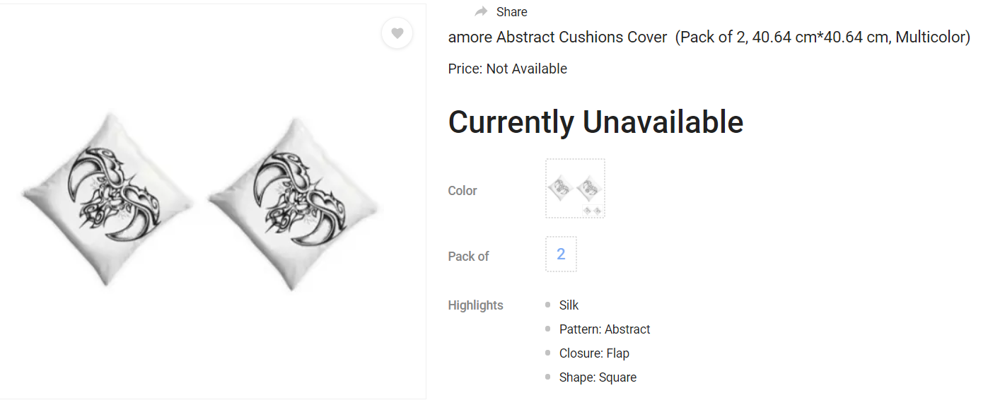

- On checking **description** for the null values the rows with the null description don't have a description on their site also.<br>
- if the description would have been available i would have scraped the data from the site itself<br>
- On checking the unique counts of the description i find that there may be products in the dataset which are lying in the same category and that's why their descriptions are aligned so much i cannot consider them duplicate rows as i didn't find any  


**Assumption : Images and product name along with descriptions can help to make a good classification algorithm therefore checking both the columns for values**

In [ ]:
df['image'].value_counts()

["http://img6a.flixcart.com/image/car-mat/m/t/a/hyundai-xcent-anti-slip-noodle-car-floor-mats-set-of-5-red-1100x1100-imaecjxhb9xhpyrc.jpeg", "http://img5a.flixcart.com/image/car-mat/m/t/a/hyundai-xcent-anti-slip-noodle-car-floor-mats-set-of-5-red-original-imaecjxhb9xhpyrc.jpeg"]                                                                                                                                                                                                                                                                                                                         45
["http://img5a.flixcart.com/image/car-mat/z/z/9/skoda-rapid-anti-slip-noodle-car-floor-mats-set-of-5-grey-allure-1100x1100-imaecjxhbzaqrmge.jpeg", "http://img6a.flixcart.com/image/car-mat/z/z/9/skoda-rapid-anti-slip-noodle-car-floor-mats-set-of-5-grey-allure-original-imaecjxhbzaqrmge.jpeg"]                                                                                                                  

In [ ]:
df[df['image'].isnull()]

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
8600,2c7ec539b7e4116d5b6127ad6514acf5,2016-01-07 05:50:25 +0000,http://www.flipkart.com/sf-sonata-7957pp06-wat...,SF by Sonata 7957PP06 Watch,"[""Watches >> Wrist Watches >> SF by Sonata Wri...",WATDZ2ZQKHQKZGGT,549.0,549.0,NaN,False,SF by Sonata 7957PP06 Watch - Buy SF by Sonata...,No rating available,No rating available,NaN,"{""product_specification""=>{""key""=>""Style Code""..."
8908,c66bd1c076b7954e38309a0d2f339c82,2016-01-07 05:50:25 +0000,http://www.flipkart.com/sonata-7945sm01-watch/...,Sonata 7945SM01 Watch,"[""Watches >> Wrist Watches >> Sonata Wrist Wat...",WATDZ2ZQGUATCWJT,980.0,921.0,NaN,False,Sonata 7945SM01 Watch - Buy Sonata 7945SM01 Wa...,No rating available,No rating available,NaN,"{""product_specification""=>{""key""=>""Style Code""..."
8943,53090ed1ff49b235423bc5ff41d19de2,2016-01-07 05:50:25 +0000,http://www.flipkart.com/sonata-7016ym07-watch/...,Sonata 7016YM07 Watch,"[""Watches >> Wrist Watches >> Sonata Wrist Wat...",WATDZ2ZQ8JPDHCTJ,1029.0,1029.0,NaN,False,Sonata 7016YM07 Watch - Buy Sonata 7016YM07 Wa...,No rating available,No rating available,NaN,"{""product_specification""=>{""key""=>""Style Code""..."


In [ ]:
df['product_name'].value_counts()

TheLostPuppy Back Cover for Apple iPad Air                                                 134
TheLostPuppy Back Cover for Apple iPad Air 2                                                95
S4S Stylish Women's Push-up Bra                                                             94
Voylla Metal, Alloy Necklace                                                                66
WallDesign Small Vinyl Sticker                                                              65
                                                                                          ... 
Printland PMR1300 Ceramic Mug                                                                1
LAIBA  Battery - Laiba Battery -B150AC Lithium Ion Mobile Battery for Samsung Core Duos      1
Avita 25 One Way Electrical Switch                                                           1
Kalpaveda Copper Copper Cuff                                                                 1
ShopMantra Flower Paintings 2015 Desk Calendar    

## Data Preprocessing

The columns those look irrelevant for the problem statement:
- uniq_id
- crawl_timestamp
- pid
- product_rating
- overall_rating
- brand (due to lot of NULL values)
- is_FK_Advantage_product

all the columns except uniq_id and pid can be same for lot of categories


In [ ]:
columns_to_remove = ['uniq_id','crawl_timestamp','pid','product_rating','overall_rating','is_FK_Advantage_product','brand']
df = df.drop(columns=columns_to_remove)

In [ ]:
df.columns

Index(['product_url', 'product_name', 'product_category_tree', 'retail_price',
       'discounted_price', 'image', 'description', 'product_specifications'],
      dtype='object')

**Extracting the target varibales from the product category_tree and making a new column in the dataframe called target which will be referred to as product category**

In [ ]:
def extract_category(text):
    '''
    Input : a string 
    Output : a cleaned string
    '''
    
    text = text.strip('[]')
    text = text.strip('"')
    
    loc = text.find('>')
    
    text = text[:loc]
    text = text.strip()
    text = text.strip('.')
    
    return text

In [ ]:
df['target'] = df['product_category_tree'].apply(lambda x : extract_category(x))

**checking the number of unique target variables**

In [ ]:
df['target'].value_counts()

Clothing                                            6198
Jewellery                                           3531
Footwear                                            1227
Mobiles & Accessories                               1099
Automotive                                          1012
                                                    ... 
Automation & Robotics                                  1
Rasav Jewels Yellow Gold Diamond 18 K Rin              1
Speedwav 186926 Royal Enfield 350 Twin Spark LED       1
Amita Home Furnishing Cotton Floral Single Bedsh       1
Speedwav 186879 Bajaj Pulsar 200 NS DTS-i LED In       1
Name: target, Length: 266, dtype: int64

**The target variables are too many probably because there is some problems with the product category tree** 

**Keywords to predict the category of a target value is being taken<br>
for each category a list is being made for checking the values in the target value** 

In [ ]:
clothing = ['fashion','clovia','t-shirt','kurta','kurt','stol','polo','brie','men\'s','women\'s','boy\'s','girl\'s','boxer','sleeve','sleeves','jean']
baby_care = ['lilliput','baby']
sunglasses = ['aviator','sunglasse']
bags_wallets = ['dressberry','clutc']
footwear = ['flat','bellie','shoe','lace','shoes','slipper','wedge']
home_decor = ['ruhi\'s','sofa']
jewellery = ['bangl','jewels','bangle','brass','rings','ring']
beauty = ['clip','brush','band']
automotive = ['bike','car','rear' ,'view','steering','bajaj','enfield']
personal_care = ['shaving','dryer']
camera = ['pan']
mobile = ['headset','samsung']

**Function is made to check and replace the word for the following categories**

In [ ]:
def modify_target(text):
    '''
    function helps to modify to predict the category of the target value 
    input : string
    output: string  
    '''
    text = text.lower()
    text = text.replace(',','')
    text = text.replace('(','')
    
    for word in text.split():
        if word in clothing:
             return 'clothing'
        elif word in baby_care:
             return 'baby care'
        elif word in sunglasses:
            return 'sunglasses'
        elif word in bags_wallets:
            return 'bags, wallets & belts'
        elif word in footwear:
            return 'footwear'
        elif word in home_decor:
            return 'home decor & festive needs'
        elif word in beauty:
            return 'beauty and personal care'
        elif word in automotive:
            return 'automotive'
        elif word in jewellery:
            return 'jewellery'
        elif word in personal_care :
            return 'health & personal care appliances'
        elif word in camera:    
            return 'cameras & accessories'
        elif word in mobile:    
            return 'mobiles & accessories'
        
    return text

In [ ]:
df['target']  = df['target'].apply(lambda x:modify_target(x))

<AxesSubplot:>

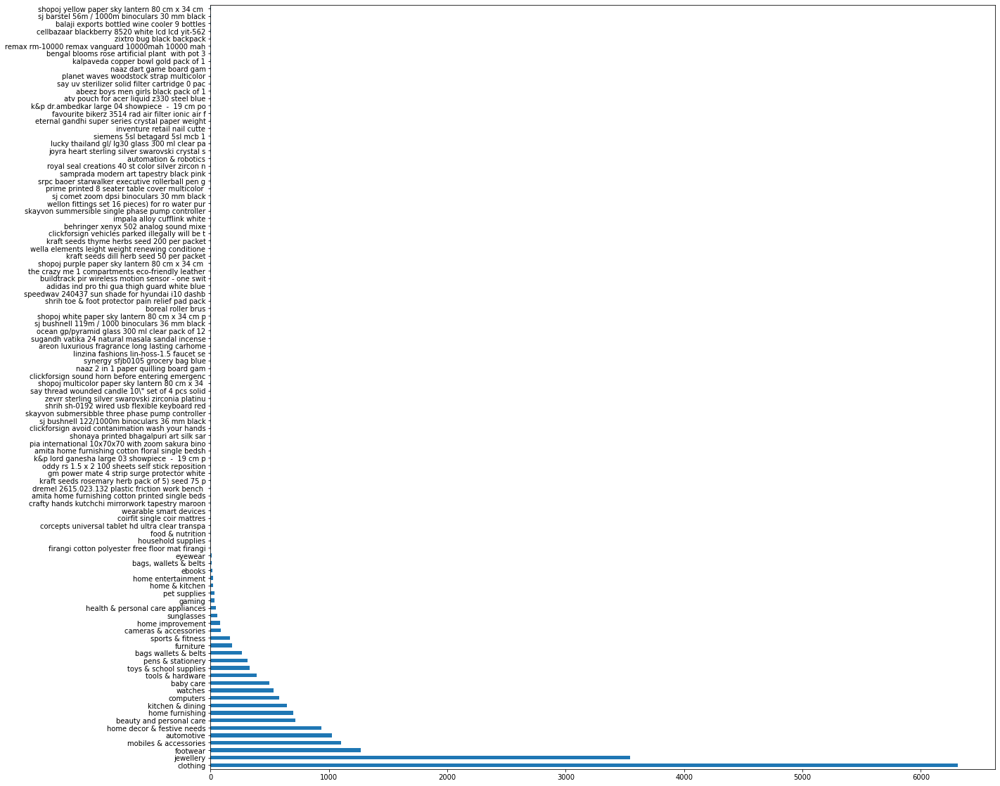

In [ ]:
plt.figure(figsize=(20,20))
df['target'].value_counts().plot(kind='barh')

**All the variables with less than 84 value count i.e (less than the count of cameras and accessories)are now made into a miscellaneous category becuase there are too many irrelevant categories which will be covered in the misceallenous which will reduce the no. of variables and help in clearer classifications**

In [ ]:
df['target'].value_counts()['cameras & accessories']

84

In [ ]:
df['target'] = df['target'].apply(lambda x: 'miscellaneous' if df['target'].value_counts()[x] <= 84 else x )

<AxesSubplot:>

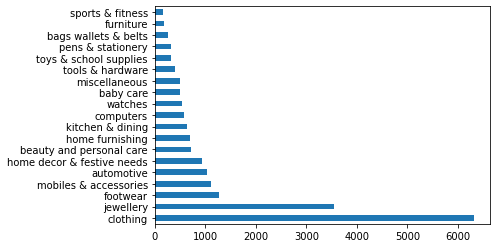

In [ ]:
df['target'].value_counts().plot(kind='barh')

**Now we have 19 categories for the products**

**Description has 2 null values it and droping them won't make significant impact on the study**

In [ ]:
df = df.dropna(subset=['description'])

In [ ]:
df.to_csv('train_2.csv',index=False)

In [ ]:
df = pd.read_csv('train_2.csv')

## Experiment 1 : Taking Description column only for multiclass classification

In [ ]:
new_df = df[['description','target']]

In [ ]:
new_df.shape

(19998, 2)

In [ ]:
new_df.sample(9)

,description,target
9814,Yepme Full Sleeve Solid Men's Jacket\n ...,clothing
4021,Buy Allure Auto CM 1442 Car Mat Ford Endeavour...,automotive
6873,FemNmas Alloy Necklace\n ...,jewellery
5395,Key Features of Satovira Party Sleeveless Soli...,clothing
2627,PrettySecrets Fashion Women's Push-up Bra - Bu...,clothing
16652,Key Features of Reinforce Solid Men's Three Fo...,clothing
18089,"Digilight 590 inch Yellow, Green, Pink Rice Li...",home decor & festive needs
17971,Buy Baby Bucket Cartoon Single Blanket blue at...,home furnishing
11979,Luxor Alloy Yellow Gold Bangle Set (Pack of 5)...,jewellery


### Text Preprocessing

In [ ]:
new_df.loc[192,'description']

'Kielz Boots - Buy Kielz Boots - 6966-20 only for Rs. 1999 from Flipkart.com. Only Genuine Products. 30 Day Replacement Guarantee. Free Shipping. Cash On Delivery!'

In [ ]:
new_df.loc[1000,'description']

'Key Features of Dupli Color Spray Paint Bottle Quantity: 150 ml No of Paint Shades: 1 Container Type: Bottle Primary Color: Red,Dupli Color Spray Paint Bottle (Set of 1, Signal Red) Price: Rs. 730 Paint Type : Neon Effect Spray | Quantity : 150 ml The Paint from the can. Excellent for indoor or outdoor use. For a wide variety of different applications. For decoration metal, wood, glass, ceramics, concrete, stone, paper, cardboard, dried flowers, plastic. Colored caps make selecting a color easy. Practical spray cans, with child-proof caps. Acrylic quality varnish. Made in Germany. Note: These colors are flashy but they dont glow in dark.,Specifications of Dupli Color Spray Paint Bottle (Set of 1, Signal Red) General Model Name Neon Effect Paint Features Paint Medium Spray Paint Container Type Bottle Number of Paint Shades 1 Dimensions Quantity 150 ml In the Box 1 Spray Paint'

In [ ]:
new_df.loc[10000,'description']

"Whistle Solid Men's Round Neck T-Shirt - Buy Maroon Whistle Solid Men's Round Neck T-Shirt For Only Rs. 999 Online in India. Shop Online For Apparels. Huge Collection of Branded Clothes Only at Flipkart.com"

**Plotting a WordCloud to visualise the irrelevant words in the corpus if any**

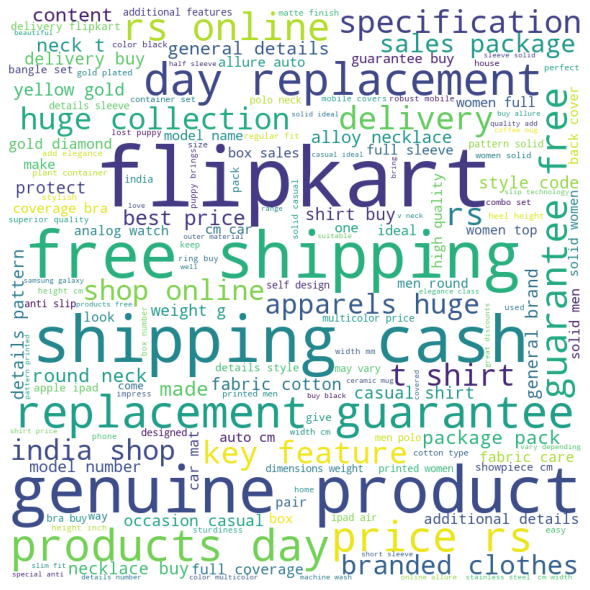

In [ ]:
comment_words = ''
for val in new_df.description:
  
    val = str(val)
    tokens = val.split()  
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
    comment_words += " ".join(tokens)+" "

wordcloud = WordCloud(width = 800, height = 800,
            background_color ='white',
            stopwords = STOPWORDS,
            min_font_size = 10).generate(comment_words)
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)

plt.show()

**Function is made to operate on the text which will do the following operations on text:**
- Remove any HTML tag 
- Remove all the punctuations 
- Lowercase Everyword
- Remove numbers
- Remove stopwords



**Creating a list of stopwords which are vague and don't give any sense of value to the corpus categorization**

In [ ]:
my_stopwords = ['rs','flipkartcom','free','shipping','product','genuine','delivery','flipkart','cash','best','price','detail','buy','day','relpacement','guarantee']

In [ ]:
nlp = English()
def text_processing(text):
    '''
    Function to clean the text
    Input: String
    Output : String
    '''
    text = text.lower()
    text = contractions.fix(text) # Remove any contractions of words
    cleanr = re.compile('<.*?>') # https://stackoverflow.com/questions/9662346/python-code-to-remove-html-tags-from-a-string
    text = re.sub(cleanr, '',text) # Remove HTML tags
    text = re.sub(r'[^\w\s]', '', text) # Remove Punctuations
    text = re.sub('[0-9]','',text)  #Remove any digits in the string
    my_doc = nlp(text)
    token_list = []
    for token in my_doc:
        token_list.append(token.text)
    
    filtered_sentence =[] 
    # Adding  My stopwords to the custom vocab
    for col in my_stopwords:
        nlp.vocab[col].is_stop = True  
    
    for word in token_list:
        lexeme = nlp.vocab[word]
        if lexeme.is_stop == False:
            filtered_sentence.append(word) 
            
    new_text = ' '.join(w for w in filtered_sentence)
    
    new_text = re.sub('\t+', ' ', new_text) # Removes tab spaces
    new_text = re.sub('\n+',' ',new_text) # Removes newline characters
    new_text = re.sub(' +', ' ', new_text) #Removes Extra Whitespaces
    
    return new_text

In [ ]:
text = new_df.loc[1000,'description']

In [ ]:
text_processing(text)

'key features dupli color spray paint bottle quantity ml paint shades container type bottle primary color reddupli color spray paint bottle set signal red paint type neon effect spray quantity ml paint excellent indoor outdoor use wide variety different applications decoration metal wood glass ceramics concrete stone paper cardboard dried flowers plastic colored caps selecting color easy practical spray cans childproof caps acrylic quality varnish germany note colors flashy glow darkspecifications dupli color spray paint bottle set signal red general model neon effect paint features paint medium spray paint container type bottle number paint shades dimensions quantity ml box spray paint'

In [ ]:
for i in tqdm(range(len(new_df))):
    new_df.loc[i,'description'] = text_processing(new_df.loc[i,'description'])

  0%|          | 0/19998 [00:00<?, ?it/s]C:\Users\nishant\anaconda3\envs\nlp\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)
<ipython-input-229-0efd0bad270a>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df.loc[i,'description'] = text_processing(new_df.loc[i,'description'])
100%|██████████| 19998/19998 [00:12<00:00, 1657.29it/s]


**After Cleaning the Description Lemmatization will be done overall the words instead of Stemming as Lemmatization keeps the real words in the dictionary** 

In [ ]:
nlp = spacy.load('en_core_web_sm')

In [ ]:
def lemmatize(text):
    '''
    Function to lemmatize
    Input:string
    Output:string
    '''
    doc = nlp(text)
    lemmatized_text = ' '.join(word.lemma_ for word in doc )
    
    return lemmatized_text
    
    

In [ ]:
new_df['description'] = new_df['description'].apply(lambda x:lemmatize(x))

<ipython-input-232-17a8d90013f9>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df['description'] = new_df['description'].apply(lambda x:lemmatize(x))


In [ ]:
new_df.head()

,description,target
0,key feature alisha solid womens cycling shorts...,clothing
1,fabhomedecor fabric double sofa bed finish col...,furniture
2,key feature aw belly sandal wedge heel casuals...,footwear
3,key feature alisha solid womens cycling short ...,clothing
4,specification sicons purpose arnica dog shampo...,miscellaneous


In [ ]:
new_df.to_csv('train_3.csv',index=False)

In [2]:
new_df = pd.read_csv('train_3.csv')

**Forming word cloud for each category in the target variable to visualise the keywords which are frequent in those categories**

In [ ]:
categories = new_df['target'].value_counts().keys()

clothing


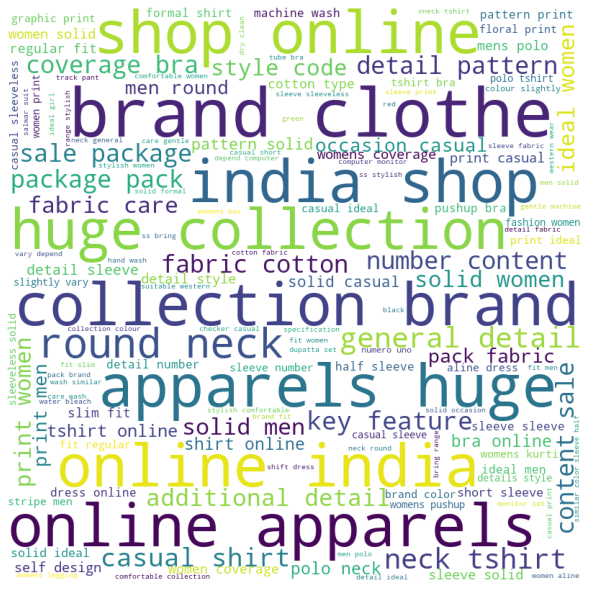

jewellery


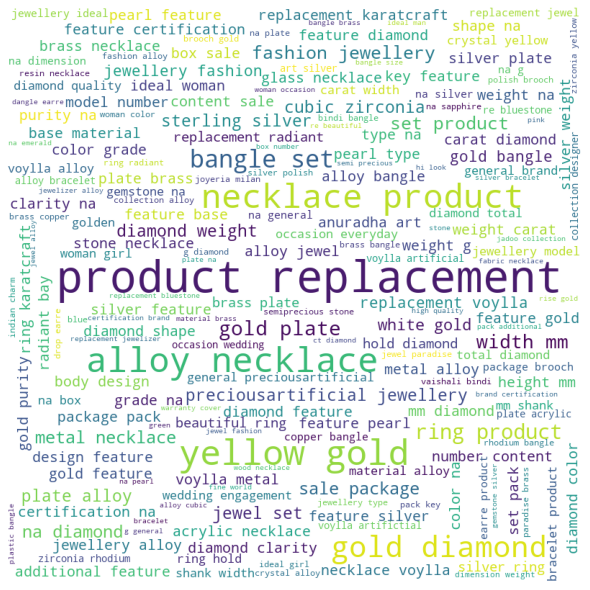

footwear


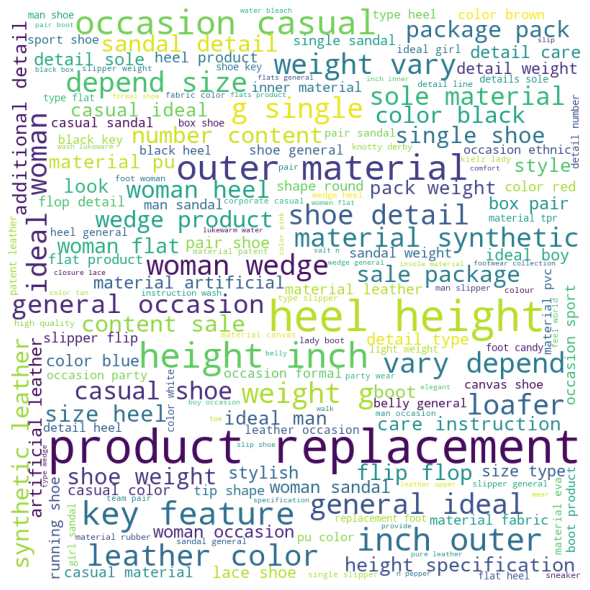

mobiles & accessories


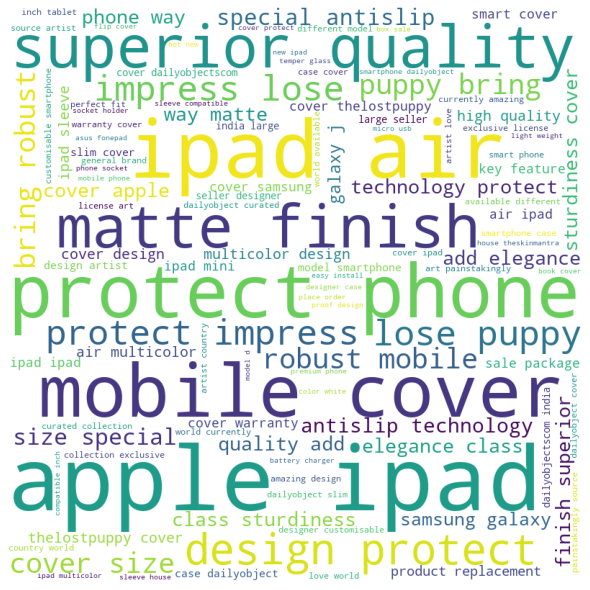

automotive


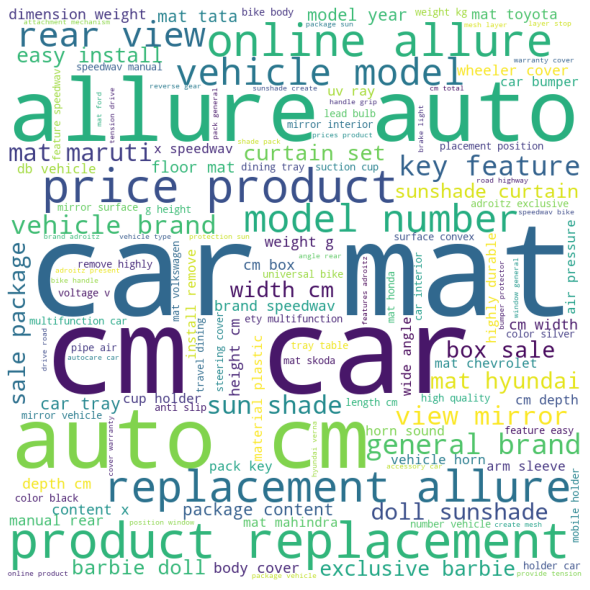

home decor & festive needs


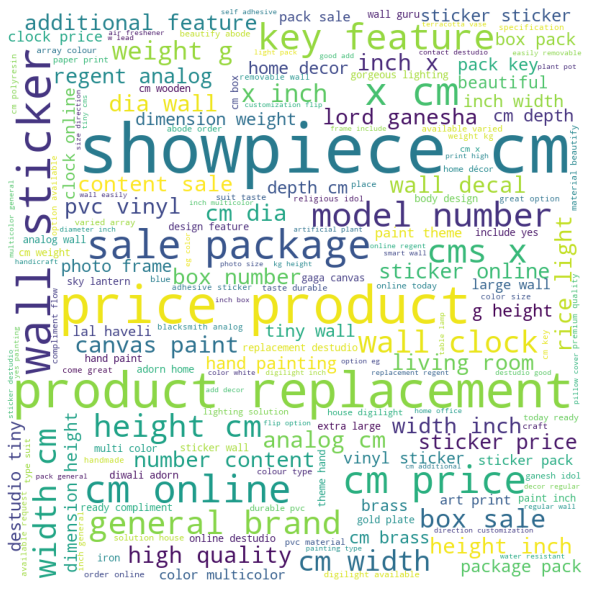

beauty and personal care


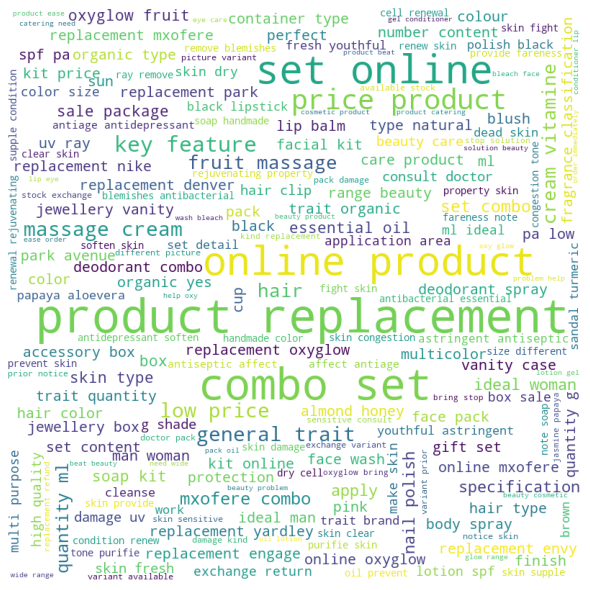

home furnishing


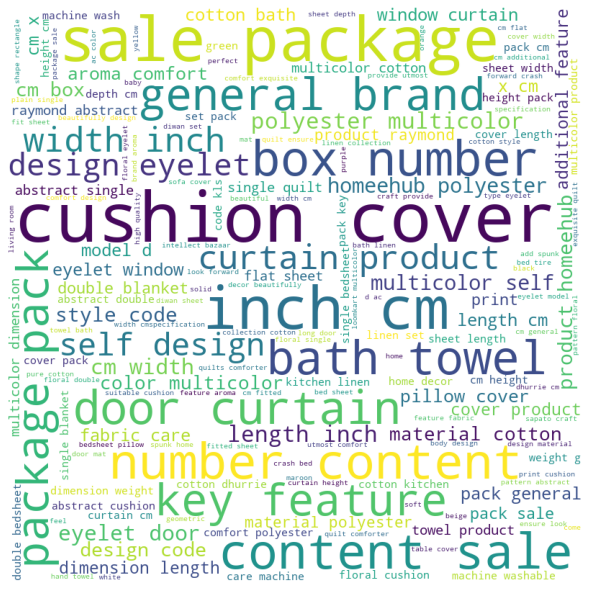

kitchen & dining


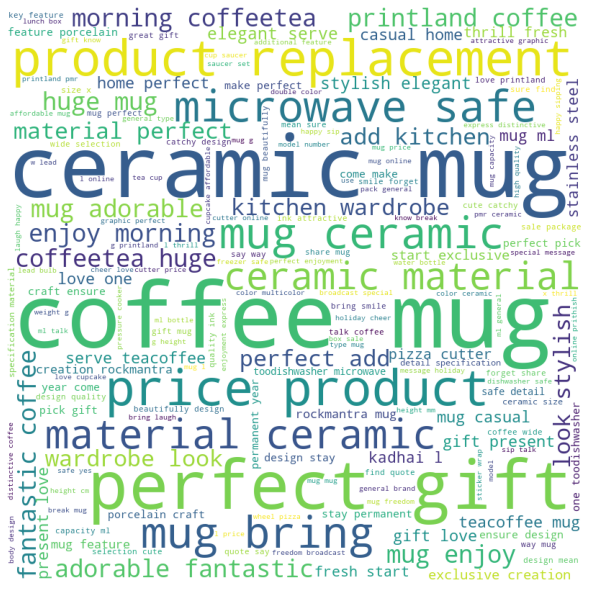

computers


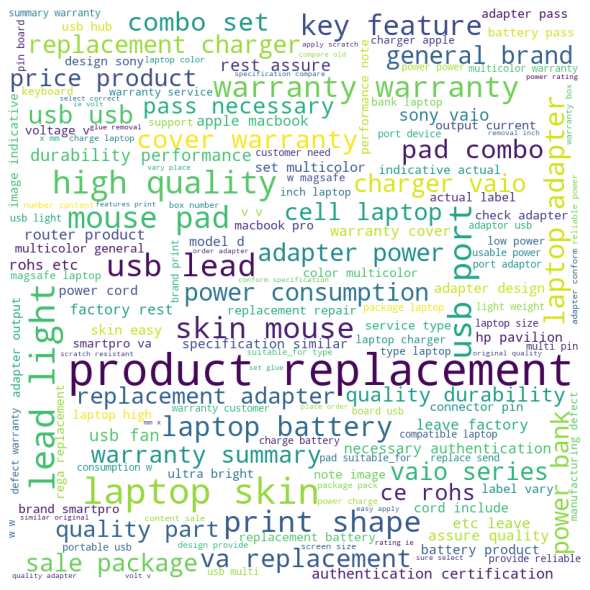

watches


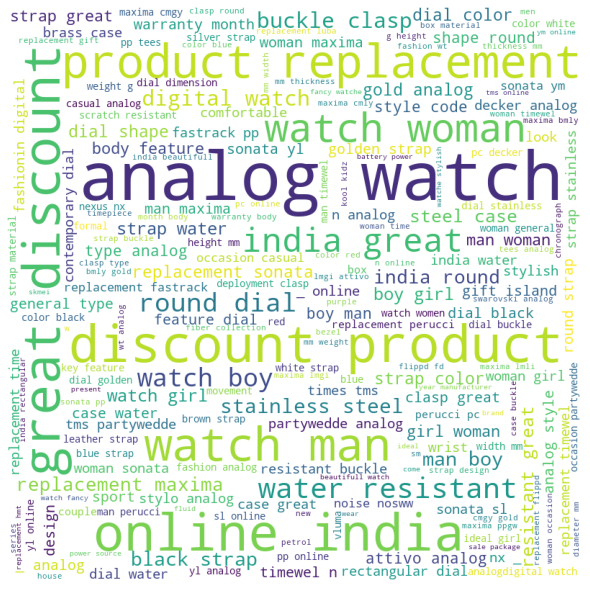

baby care


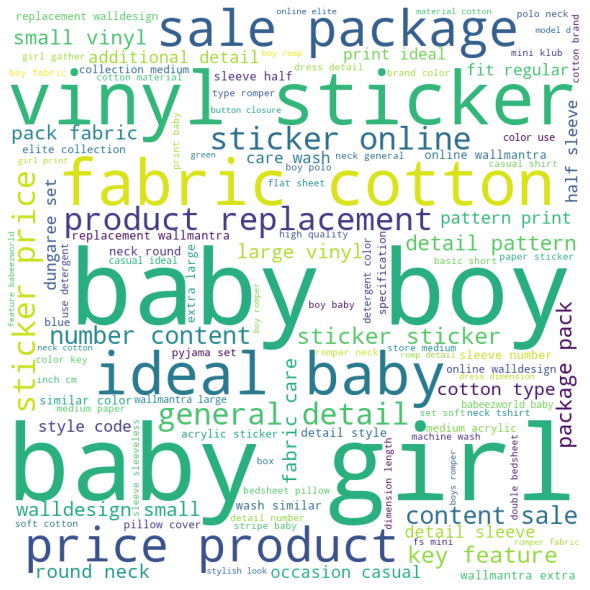

miscellaneous


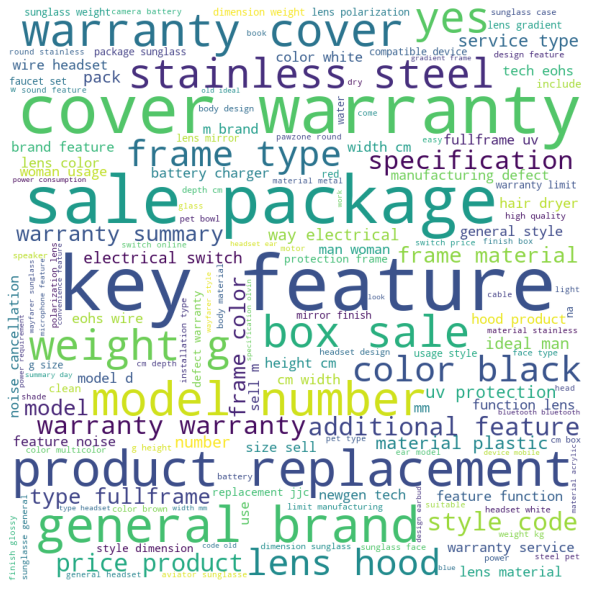

tools & hardware


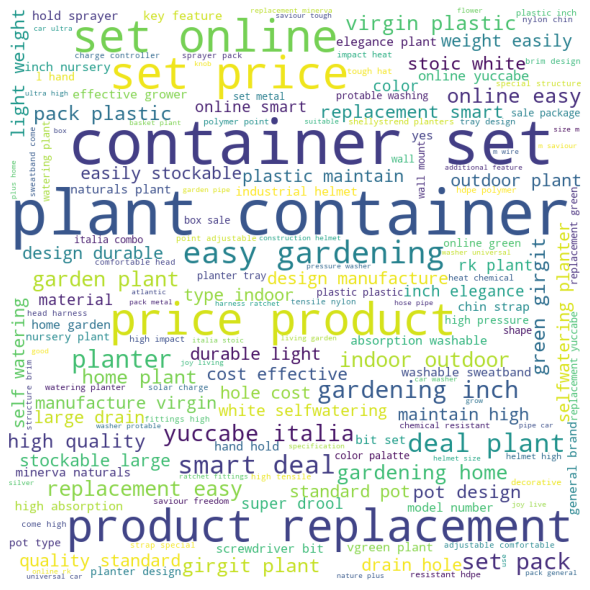

toys & school supplies


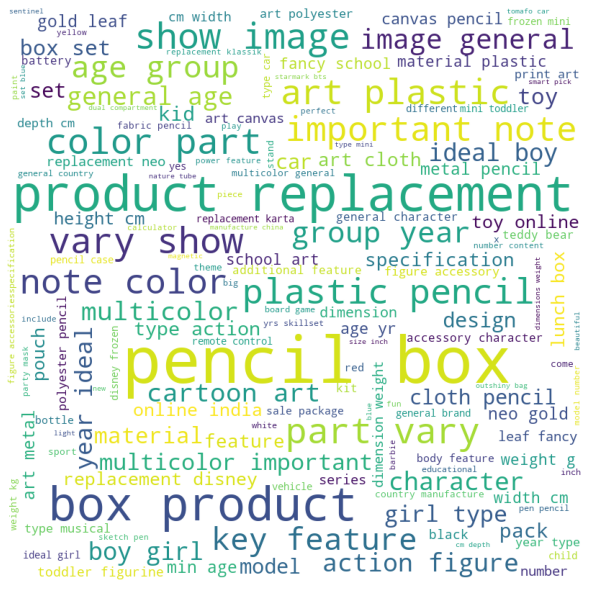

pens & stationery


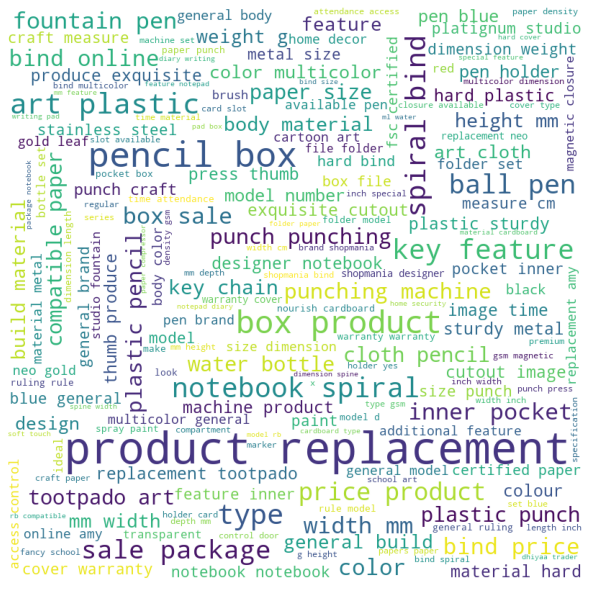

bags wallets & belts


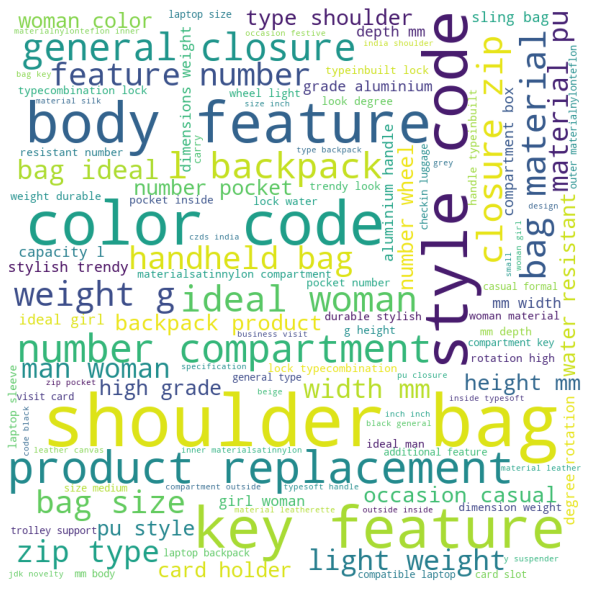

furniture


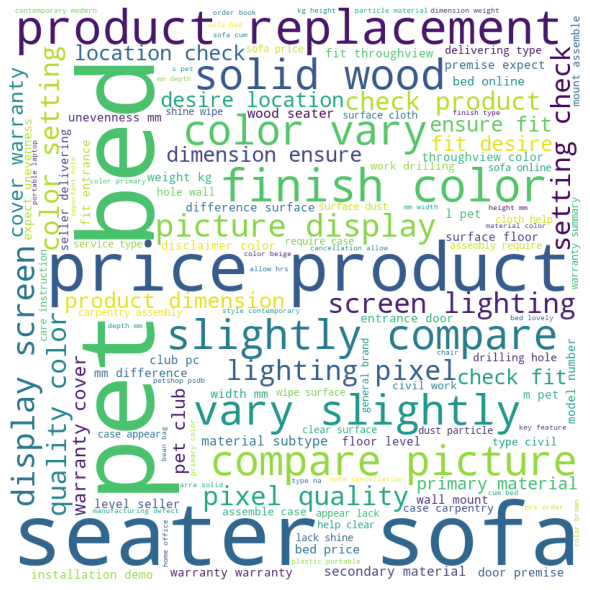

sports & fitness


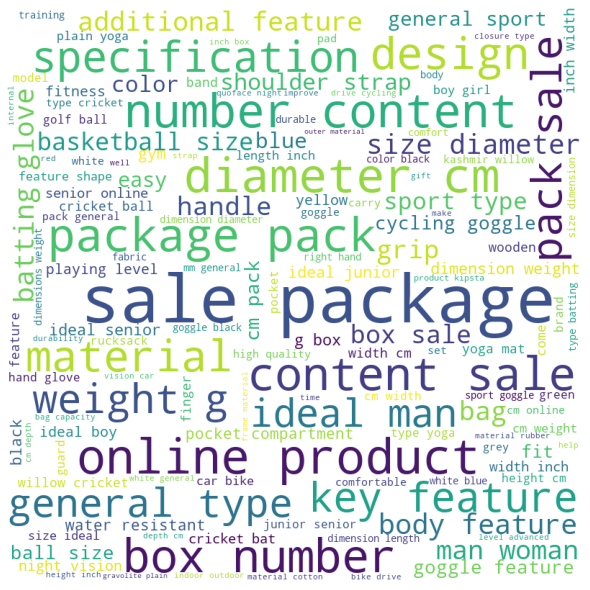

In [ ]:
for cat in categories:
    comment_words = ''
    print(cat)
    for val in new_df[new_df['target']==cat].description:
  
        val = str(val)
        tokens = val.split()  
        comment_words += " ".join(tokens)+" "

    wordcloud = WordCloud(width = 800, height = 800,
                    background_color ='white',
                    min_font_size = 10).generate(comment_words)
    
    plt.figure(figsize = (8, 8), facecolor = None)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.tight_layout(pad = 0)

    plt.show()

**The Word cloud Visualization of every category allows us to know that there are relevant words occuring most frequently for each category** 

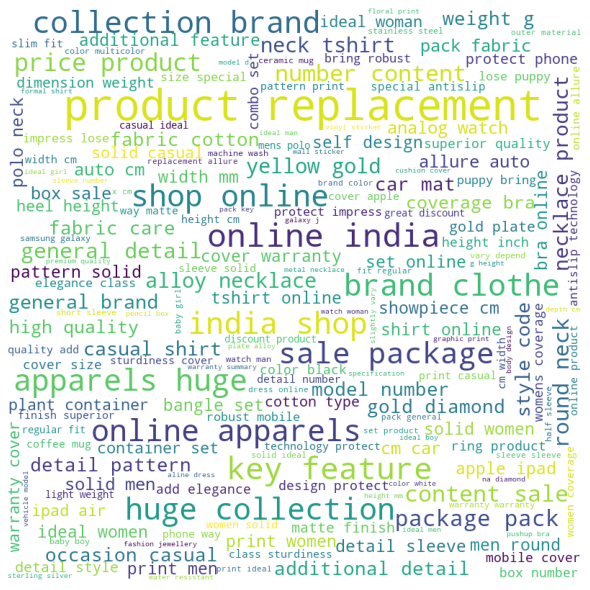

In [ ]:
comment_words = ''
for val in new_df.description:
  
    val = str(val)
    tokens = val.split()  
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
    comment_words += " ".join(tokens)+" "

wordcloud = WordCloud(width = 800, height = 800,
            background_color ='white',
            stopwords = STOPWORDS,
            min_font_size = 10).generate(comment_words)
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)

plt.show()

**Checking the Top Words in my corpus**

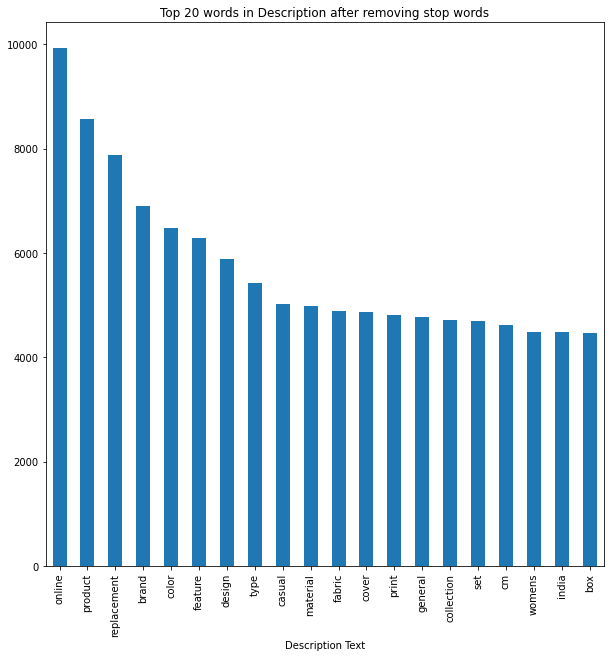

In [ ]:
#https://towardsdatascience.com/a-complete-exploratory-data-analysis-and-visualization-for-text-data-29fb1b96fb6a
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer(stop_words = 'english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]


common_words = get_top_n_words(new_df['description'], 20)
df2 = pd.DataFrame(common_words, columns = ['Description Text' , 'count'])

plt.figure(figsize=(10,10))
df2.groupby('Description Text').sum()['count'].sort_values(ascending=False).plot(
    kind='bar', title='Top 20 words in Description after removing stop words')
plt.show()

## Experiment 1.1 Machine Learning Methods with Bag Of Words

**Going to apply Machine Learning Algorithm with bag of words to make the vocab** 

In [3]:
vectorizer = CountVectorizer()
X = vectorizer.fit_transform(new_df['description']).toarray()

In [6]:
print(X.shape)

(19998, 23042)


In [4]:
X = normalize(X)

**23042 is the size of our vocab**

**23042 is a huge dimension to deal with it will lead to curse of dimensionality problem so for reducing the dimensions we will apply PCA(Principal Component Analysis) on the variables**

In [8]:
len_list = [i for i in range(500,2001,250)]

In [ ]:
variance_explained = []
for length in len_list:
    print(length)
    pca = PCA(n_components=length)
    X_pca = pca.fit_transform(X)
    variance_explained.append(round(sum(list(pca.explained_variance_ratio_))*100, 2)) 

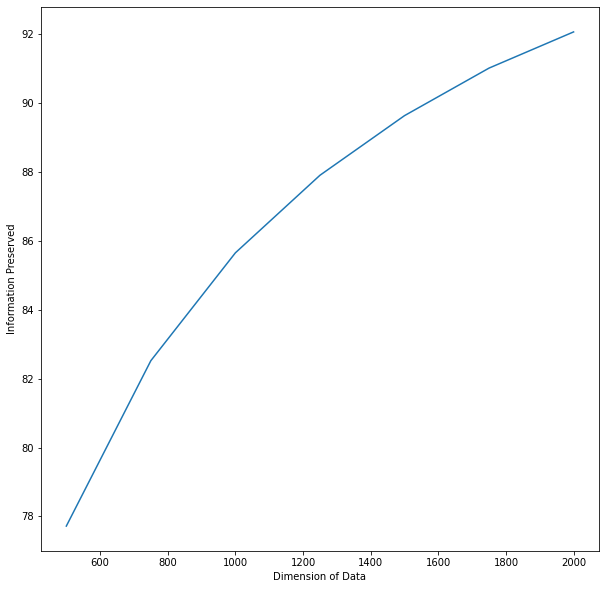

In [10]:
plt.figure(figsize=(10,10))
plt.plot(len_list,variance_explained)
plt.xlabel('Dimension of Data')
plt.ylabel('Information Preserved')
plt.show()


**It looks like that 1600 feature will be a godd choice because it preserves almost 90% of information**

In [5]:
pca = PCA(n_components=1600)
X_pca = pca.fit_transform(X)

In [6]:
X_pca.shape

(19998, 1600)

**Label Encode the target variables**

In [7]:
le = LabelEncoder()
y = le.fit_transform(new_df['target'])

In [8]:
y.shape

(19998,)

**Creating the DataFrame and Concatenating both the variables so i can create folds out of the final Bag Of Words DataFrame** 

In [9]:
X = pd.DataFrame(X_pca)
y = pd.DataFrame(y,columns=['category_of_product'])

In [10]:
bow_df = pd.concat([X,y],axis=1)

**As the Labels are Skewed in the Target therefore i am using Stratified k-fold Cross Validation because if normal k-fold cross validation is used there might be a chance of leaving the minority labels in any fold**

In [54]:
def create_folds(df):
    '''
    Function to create Stratified K Fold
    Input = Dataframe
    Output = NULL
    '''
    df['kfold'] = -1
    df = df.sample(frac=1).reset_index(drop=True)
    y = df.category_of_product.values
    
    kf = model_selection.StratifiedKFold(n_splits=5)
    
    for f,(t_,v_) in enumerate(kf.split(X=df,y=y)):
        df.loc[v_,'kfold'] = f
        
        
    df.to_csv('train_4.csv',index=False)
    return df

In [12]:
df = create_folds(bow_df)

In [13]:
df = pd.read_csv('bow_train.csv')

**Function to run each fold will be created now to check for each model. F1 Score average macro is been selected as Evaluation metric as it will give equal importance to the misclassification of all the classes equally whereas Accuracy can be misleading in this problem statement**

In [3]:
def run_folds(df,fold,model):
    '''
    Funtcion to train and predict on the models on the given fold
    Input : Dataframe,Integer,Model
    Output: NULL
    '''
    df_train = df[df.kfold!=fold].reset_index(drop=True)
    df_valid = df[df.kfold==fold].reset_index(drop=True)
    
    x_train = df_train.drop('category_of_product',axis=1).values
    y_train = df_train.category_of_product.values
    
    x_valid = df_valid.drop('category_of_product',axis=1).values
    y_valid = df_valid.category_of_product.values
    
    clf = models[model]
    
    clf.fit(x_train,y_train)
    train_preds = clf.predict(x_train)
    preds = clf.predict(x_valid)
    print(f'Fold{fold}')
    print('Train F1 Score:{}'.format(f1_score(y_train, train_preds, average='macro')))
    print('Validation F1 Score:{}'.format(f1_score(y_valid, preds, average='macro')))
    print('*'*50)
    
  #  joblib.dump(clf,f'models/dt_{fold}_{model}.bin')
    
    return

In [4]:
models = {
    'gnb':GaussianNB(),
    'lr':LogisticRegression(),
    'svc':SVC(kernel = 'linear', C = 1),
    'knn':KNeighborsClassifier(n_neighbors = 7),
    'rf':RandomForestClassifier(),
    'mnb':MultinomialNB()
}

In [ ]:
df[df.kfold==1]['category_of_product'].value_counts()

4     1263
10     709
6      253
13     221
0      205
8      187
3      143
9      140
11     129
5      116
18     106
1      100
12      99
16      78
17      66
14      63
2       53
7       36
15      33
Name: category_of_product, dtype: int64

In [ ]:
df[df.kfold==0]['category_of_product'].value_counts()

4     1263
10     710
6      253
13     220
0      205
8      187
3      143
9      140
11     130
5      116
18     106
12      99
1       99
16      78
17      66
14      63
2       53
7       36
15      33
Name: category_of_product, dtype: int64

In [16]:
for i in range(5):
    run_folds(df,i,'lr')

C:\Users\nishant\anaconda3\envs\nlp\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Fold0
Train F1 Score:0.9317975733898113
Validation F1 Score:0.9214336997482477
**************************************************


C:\Users\nishant\anaconda3\envs\nlp\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Fold1
Train F1 Score:0.9352405049690034
Validation F1 Score:0.908724925894547
**************************************************


C:\Users\nishant\anaconda3\envs\nlp\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Fold2
Train F1 Score:0.9352296236580603
Validation F1 Score:0.9068225632088842
**************************************************


C:\Users\nishant\anaconda3\envs\nlp\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Fold3
Train F1 Score:0.9370664278018562
Validation F1 Score:0.9153020245450394
**************************************************


C:\Users\nishant\anaconda3\envs\nlp\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Fold4
Train F1 Score:0.9365993559015777
Validation F1 Score:0.9141333187513073
**************************************************


In [17]:
for i in range(5):
    run_folds(df,i,'gnb')

Fold0
Train F1 Score:0.5454445812076817
Validation F1 Score:0.5228738597648674
**************************************************
Fold1
Train F1 Score:0.5380193522840546
Validation F1 Score:0.5068837911181113
**************************************************
Fold2
Train F1 Score:0.5454424198011149
Validation F1 Score:0.5080033382462803
**************************************************
Fold3
Train F1 Score:0.5395258473695684
Validation F1 Score:0.5099363873152587
**************************************************
Fold4
Train F1 Score:0.5419723950116777
Validation F1 Score:0.49163443588036193
**************************************************


In [18]:
for i in range(5):
    run_folds(df,i,'svc')

Fold0
Train F1 Score:0.9549335361724324
Validation F1 Score:0.9365929990798565
**************************************************
Fold1
Train F1 Score:0.9579155837609207
Validation F1 Score:0.926648317801728
**************************************************
Fold2
Train F1 Score:0.9561549585259035
Validation F1 Score:0.9391172239867148
**************************************************
Fold3
Train F1 Score:0.9589733963949243
Validation F1 Score:0.9351144179673546
**************************************************
Fold4
Train F1 Score:0.960239382911333
Validation F1 Score:0.9340234251136876
**************************************************


In [19]:
for i in range(5):
    run_folds(df,i,'knn')

Fold0
Train F1 Score:0.897435549046946
Validation F1 Score:0.8388862994873352
**************************************************
Fold1
Train F1 Score:0.9005301593721928
Validation F1 Score:0.8715800792835764
**************************************************
Fold2
Train F1 Score:0.8991496496265357
Validation F1 Score:0.8818424866469557
**************************************************
Fold3
Train F1 Score:0.8976123030003006
Validation F1 Score:0.8756101474204423
**************************************************
Fold4
Train F1 Score:0.89773821931555
Validation F1 Score:0.831308618342822
**************************************************


In [20]:
for i in range(5):
    run_folds(df,i,'rf')

Fold0
Train F1 Score:0.9983788485875525
Validation F1 Score:0.9044295212332133
**************************************************
Fold1
Train F1 Score:0.9985690782225658
Validation F1 Score:0.9060628995868105
**************************************************
Fold2
Train F1 Score:0.998582672096842
Validation F1 Score:0.894643975763729
**************************************************
Fold3
Train F1 Score:0.9987856132634797
Validation F1 Score:0.8969883616490355
**************************************************
Fold4
Train F1 Score:0.9991975273034392
Validation F1 Score:0.8950045733356307
**************************************************


**Findings till now is that SVM clearly is much effective in classification than other algorithms with 0.939 F1 Score and then with slight difference Logistic Regression also can be effective algorithm for prediction, Gaussian Naive Bayes performed poorly on the data as it has strong assumption of normal distribution on features where as knn performed also good but not above 0.88 F1 score , random forest overfits the data.**

**Now I will use these two algorithms SVM and Logistic Regression on the Tf-Idf features too and then proceed to hyperparameter optimization according to results**

## Experiment 1.2 Machine Learning Algorithm with Tf-Idf 

In [21]:
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(new_df['description']).toarray()

**Again PCA on the tfidf to check the best number of features to keep**

500
750
1000
1250
1500
1750
2000


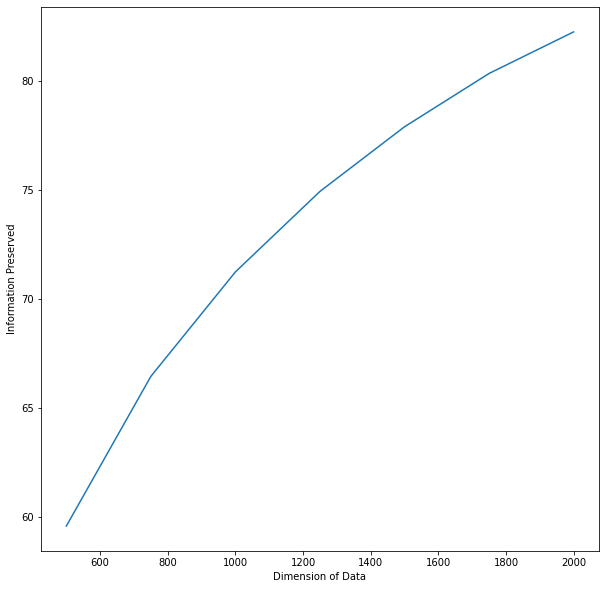

In [ ]:
len_list = [i for i in range(500,2001,250)]
variance_explained = []
for length in len_list:
    print(length)
    pca = PCA(n_components=length)
    X_pca = pca.fit_transform(X)
    variance_explained.append(round(sum(list(pca.explained_variance_ratio_))*100, 2))
plt.figure(figsize=(10,10))
plt.plot(len_list,variance_explained)
plt.xlabel('Dimension of Data')
plt.ylabel('Information Preserved')
plt.show()

In [ ]:
pca = PCA(n_components=3500)
X_pca = pca.fit_transform(X)
print('Information Preserved:{}'.format(round(sum(list(pca.explained_variance_ratio_))*100, 2)))

Information Preserved:90.39



**As we can see from the graph that a lot of information is lossed when taking upto 2000 features but randomly when i check for 3500 features it just gets upto threshold set by me for features**

In [ ]:
X = pd.DataFrame(X_pca)
y = pd.DataFrame(y,columns=['category_of_product'])
tfidf_df = pd.concat([X,y],axis=1)

In [ ]:
df = create_folds(tfidf_df)

In [186]:
df = pd.read_csv('tfidf_train.csv')

In [ ]:
for i in range(5):
    run_folds(df,i,'lr')

C:\Users\nishant\anaconda3\envs\nlp\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Fold0
Train F1 Score:0.9462221452070892
Validation F1 Score:0.9179081199805993
**************************************************


C:\Users\nishant\anaconda3\envs\nlp\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Fold1
Train F1 Score:0.944586283630027
Validation F1 Score:0.9120359218531142
**************************************************


C:\Users\nishant\anaconda3\envs\nlp\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Fold2
Train F1 Score:0.9461533313443028
Validation F1 Score:0.9114745698715263
**************************************************


C:\Users\nishant\anaconda3\envs\nlp\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Fold3
Train F1 Score:0.9490042789584101
Validation F1 Score:0.9270336742336865
**************************************************


C:\Users\nishant\anaconda3\envs\nlp\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Fold4
Train F1 Score:0.9490504508860772
Validation F1 Score:0.9171318386232322
**************************************************


In [34]:
for i in range(5):
    run_folds(df,i,'svc')

Fold0
Train F1 Score:0.9691068127889041
Validation F1 Score:0.9427885658787254
**************************************************
Fold1
Train F1 Score:0.9682806522145753
Validation F1 Score:0.9445557696541783
**************************************************
Fold2
Train F1 Score:0.9705523407027135
Validation F1 Score:0.9319117344774913
**************************************************
Fold3
Train F1 Score:0.9695998964672233
Validation F1 Score:0.9482569040875963
**************************************************
Fold4
Train F1 Score:0.9684798879153226
Validation F1 Score:0.936051049464864
**************************************************


In [35]:
for i in range(5):
    run_folds(df,i,'rf')

Fold0
Train F1 Score:0.9980722114316753
Validation F1 Score:0.8981221854525869
**************************************************
Fold1
Train F1 Score:0.9981460026225546
Validation F1 Score:0.8982481644211584
**************************************************
Fold2
Train F1 Score:0.9985931050905513
Validation F1 Score:0.8965983786316087
**************************************************
Fold3
Train F1 Score:0.9982729066873525
Validation F1 Score:0.9056826345571282
**************************************************
Fold4
Train F1 Score:0.99828252200383
Validation F1 Score:0.8873764457105134
**************************************************


**Findings for Tf-Idf : SVC again outperforms every other algorithm with 0.9482 F1 score for validation set and moreover tf-idf has performed better than Bag of Words**

## Experiment 1.3 MLP(Multi Layer Perceptron) with Tf-Idf

**Designing the model and giving 3501 inputs to the network and using softmax as the output**

In [165]:
model = Sequential()
model.add(Dense(512, input_dim=3501, activation='relu'))
model.add(Dense(256, activation='relu'))
model.add(Dense(128, activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dense(32 ,activation='relu'))
model.add(Dense(19, activation='softmax'))

In [79]:
model.summary()

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_36 (Dense)             (None, 512)               1793024   
_________________________________________________________________
dense_37 (Dense)             (None, 256)               131328    
_________________________________________________________________
dense_38 (Dense)             (None, 128)               32896     
_________________________________________________________________
dense_39 (Dense)             (None, 64)                8256      
_________________________________________________________________
dense_40 (Dense)             (None, 32)                2080      
_________________________________________________________________
dense_41 (Dense)             (None, 19)                627       
Total params: 1,968,211
Trainable params: 1,968,211
Non-trainable params: 0
____________________________________________

In [166]:
model.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

**When getting the f1 score through the Sklearn inbuilt function it is creating an error so i created another function to extract the macro f1 score from the classification report**

In [5]:
def f1_score_extract(y_true,y_preds):
    s =classification_report(y_true,y_preds, digits=19)
    k = s.split('\n')[-3]
    return k.split(' ')[-7]

**Running and validating every fold on MLP and saving the best model and checking the validation f1 score for different folds**

In [182]:
for fold in range(5):
    
    model = Sequential()
    model.add(Dense(512, input_dim=3501, activation='relu'))
    model.add(Dense(256, activation='relu'))
    model.add(Dense(128, activation='relu'))
    model.add(Dense(64, activation='relu'))
    model.add(Dense(32 ,activation='relu'))
    model.add(Dense(19, activation='softmax'))
    model.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])
    
    modelcheckpoint =  ModelCheckpoint('best_model.hdf5',monitor='loss',save_weights_only=True,mode='min')
    df_train = df[df.kfold!=fold].reset_index(drop=True)
    df_valid = df[df.kfold==fold].reset_index(drop=True)

    x_train = df_train.drop('category_of_product',axis=1).values
    y_train = df_train.category_of_product.values

    y_train = to_categorical(y_train)
    hist_model = model.fit(x_train,y_train,batch_size =64,epochs=75,callbacks=[modelcheckpoint])
    
    x_valid = df_valid.drop('category_of_product',axis=1).values
    y_valid = df_valid.category_of_product.values
    
    model.load_weights('best_model.hdf5')
    train_preds = model.predict(x_train)
    preds = model.predict(x_valid)
    
    y_valid_preds = preds.argmax(axis=1)
    y_train_preds = train_preds.argmax(axis=1)
    
    y_train = df_train.category_of_product.values
    
    print(f'Fold:{fold}')
    print('Train F1 Score:{}'.format(f1_score_extract(y_train,y_train_preds)))
    print('Valid F1 Score:{}'.format(f1_score_extract(y_valid,y_valid_preds)))
    print('*'*50)
    

Epoch 1/75
250/250 [==============================] - 5s 15ms/step - loss: 1.8189 - accuracy: 0.4758
Epoch 2/75
250/250 [==============================] - 4s 16ms/step - loss: 0.1573 - accuracy: 0.9590
Epoch 3/75
250/250 [==============================] - 4s 14ms/step - loss: 0.0592 - accuracy: 0.9836
Epoch 4/75
250/250 [==============================] - 3s 14ms/step - loss: 0.0301 - accuracy: 0.9917
Epoch 5/75
250/250 [==============================] - 4s 15ms/step - loss: 0.0333 - accuracy: 0.9914
Epoch 6/75
250/250 [==============================] - 4s 16ms/step - loss: 0.0262 - accuracy: 0.9928
Epoch 7/75
250/250 [==============================] - 4s 16ms/step - loss: 0.0234 - accuracy: 0.9936
Epoch 8/75
250/250 [==============================] - 4s 16ms/step - loss: 0.0217 - accuracy: 0.9939
Epoch 9/75
250/250 [==============================] - 4s 15ms/step - loss: 0.0257 - accuracy: 0.9924
Epoch 10/75
250/250 [==============================] - 4s 16ms/step - loss: 0.0139 - accura

250/250 [==============================] - 4s 14ms/step - loss: 0.0139 - accuracy: 0.9957
Epoch 8/75
250/250 [==============================] - 3s 14ms/step - loss: 0.0196 - accuracy: 0.9940
Epoch 9/75
250/250 [==============================] - 4s 15ms/step - loss: 0.0269 - accuracy: 0.9925
Epoch 10/75
250/250 [==============================] - 4s 15ms/step - loss: 0.0234 - accuracy: 0.9935
Epoch 11/75
250/250 [==============================] - 3s 14ms/step - loss: 0.0146 - accuracy: 0.9954
Epoch 12/75
250/250 [==============================] - 4s 14ms/step - loss: 0.0114 - accuracy: 0.9954
Epoch 13/75
250/250 [==============================] - 3s 14ms/step - loss: 0.0084 - accuracy: 0.9972
Epoch 14/75
250/250 [==============================] - 4s 14ms/step - loss: 0.0101 - accuracy: 0.9964
Epoch 15/75
250/250 [==============================] - 4s 14ms/step - loss: 0.0211 - accuracy: 0.9941
Epoch 16/75
250/250 [==============================] - 3s 14ms/step - loss: 0.0217 - accuracy: 0

250/250 [==============================] - 4s 15ms/step - loss: 0.0241 - accuracy: 0.9945
Epoch 16/75
250/250 [==============================] - 4s 15ms/step - loss: 0.0148 - accuracy: 0.9958
Epoch 17/75
250/250 [==============================] - 4s 15ms/step - loss: 0.0185 - accuracy: 0.9945
Epoch 18/75
250/250 [==============================] - 4s 14ms/step - loss: 0.0139 - accuracy: 0.9968
Epoch 19/75
250/250 [==============================] - 4s 15ms/step - loss: 0.0065 - accuracy: 0.9974
Epoch 20/75
250/250 [==============================] - 4s 14ms/step - loss: 0.0101 - accuracy: 0.9961
Epoch 21/75
250/250 [==============================] - 4s 15ms/step - loss: 0.0051 - accuracy: 0.9988
Epoch 22/75
250/250 [==============================] - 4s 15ms/step - loss: 0.0064 - accuracy: 0.9973
Epoch 23/75
250/250 [==============================] - 4s 15ms/step - loss: 0.0085 - accuracy: 0.9979
Epoch 24/75
250/250 [==============================] - 4s 15ms/step - loss: 0.0044 - accuracy:

In [187]:
for fold in range(5):
    
    model = Sequential()
    model.add(Dense(512, input_dim=3501, activation='relu'))
    model.add(Dense(256, activation='relu'))
    model.add(Dense(128, activation='relu'))
    model.add(Dense(64, activation='relu'))
    model.add(Dense(32 ,activation='relu'))
    model.add(Dense(19, activation='softmax'))
    model.compile(loss='categorical_crossentropy',optimizer='rmsprop',metrics=['accuracy'])
    
    modelcheckpoint =  ModelCheckpoint('best_model.hdf5',monitor='loss',save_weights_only=True,mode='min')
    df_train = df[df.kfold!=fold].reset_index(drop=True)
    df_valid = df[df.kfold==fold].reset_index(drop=True)

    x_train = df_train.drop('category_of_product',axis=1).values
    y_train = df_train.category_of_product.values

    y_train = to_categorical(y_train)
    hist_model = model.fit(x_train,y_train,batch_size =64,epochs=75,callbacks=[modelcheckpoint])
    
    x_valid = df_valid.drop('category_of_product',axis=1).values
    y_valid = df_valid.category_of_product.values
    
    model.load_weights('best_model.hdf5')
    train_preds = model.predict(x_train)
    preds = model.predict(x_valid)
    
    y_valid_preds = preds.argmax(axis=1)
    y_train_preds = train_preds.argmax(axis=1)
    
    y_train = df_train.category_of_product.values
    
    print(f'Fold:{fold}')
    print('Train F1 Score:{}'.format(f1_score_extract(y_train,y_train_preds)))
    print('Valid F1 Score:{}'.format(f1_score_extract(y_valid,y_valid_preds)))
    print('*'*50)
    

Epoch 1/75
250/250 [==============================] - 11s 33ms/step - loss: 1.5903 - accuracy: 0.5209
Epoch 2/75
250/250 [==============================] - 8s 32ms/step - loss: 0.1947 - accuracy: 0.9492
Epoch 3/75
250/250 [==============================] - 8s 33ms/step - loss: 0.0649 - accuracy: 0.9819
Epoch 4/75
250/250 [==============================] - 8s 33ms/step - loss: 0.0383 - accuracy: 0.9883 0s -
Epoch 5/75
250/250 [==============================] - 8s 33ms/step - loss: 0.0277 - accuracy: 0.9915
Epoch 6/75
250/250 [==============================] - 8s 33ms/step - loss: 0.0202 - accuracy: 0.9942 0s - los
Epoch 7/75
250/250 [==============================] - 8s 33ms/step - loss: 0.0180 - accuracy: 0.9946
Epoch 8/75
250/250 [==============================] - 8s 33ms/step - loss: 0.0156 - accuracy: 0.9954
Epoch 9/75
250/250 [==============================] - 8s 33ms/step - loss: 0.0128 - accuracy: 0.9958
Epoch 10/75
250/250 [==============================] - 8s 33ms/step - loss: 

250/250 [==============================] - 8s 32ms/step - loss: 0.0339 - accuracy: 0.9909
Epoch 5/75
250/250 [==============================] - 8s 32ms/step - loss: 0.0269 - accuracy: 0.9924
Epoch 6/75
250/250 [==============================] - 8s 32ms/step - loss: 0.0191 - accuracy: 0.9935
Epoch 7/75
250/250 [==============================] - 8s 33ms/step - loss: 0.0210 - accuracy: 0.9934 1s - - ETA: 0s - los
Epoch 8/75
250/250 [==============================] - 8s 33ms/step - loss: 0.0135 - accuracy: 0.9958
Epoch 9/75
250/250 [==============================] - 8s 33ms/step - loss: 0.0125 - accuracy: 0.9965
Epoch 10/75
250/250 [==============================] - 8s 33ms/step - loss: 0.0114 - accuracy: 0.9970
Epoch 11/75
250/250 [==============================] - 8s 33ms/step - loss: 0.0079 - accuracy: 0.9977
Epoch 12/75
250/250 [==============================] - 8s 33ms/step - loss: 0.0087 - accuracy: 0.9974
Epoch 13/75
250/250 [==============================] - 8s 33ms/step - loss: 0.

250/250 [==============================] - 8s 33ms/step - loss: 0.0146 - accuracy: 0.9956
Epoch 8/75
250/250 [==============================] - 8s 33ms/step - loss: 0.0151 - accuracy: 0.9960
Epoch 9/75
250/250 [==============================] - 8s 34ms/step - loss: 0.0118 - accuracy: 0.9962
Epoch 10/75
250/250 [==============================] - 8s 33ms/step - loss: 0.0098 - accuracy: 0.9967
Epoch 11/75
250/250 [==============================] - 8s 34ms/step - loss: 0.0083 - accuracy: 0.9972
Epoch 12/75
250/250 [==============================] - 8s 33ms/step - loss: 0.0051 - accuracy: 0.9978
Epoch 13/75
250/250 [==============================] - 9s 34ms/step - loss: 0.0063 - accuracy: 0.9975
Epoch 14/75
250/250 [==============================] - 8s 34ms/step - loss: 0.0086 - accuracy: 0.9974
Epoch 15/75
250/250 [==============================] - 8s 33ms/step - loss: 0.0056 - accuracy: 0.9982 0s - loss: 0.0
Epoch 16/75
250/250 [==============================] - 8s 33ms/step - loss: 0.007

**The MLP reaches upto 0.93 validation but still SVC is performing better than the Neural Networks and Adam optimizer is one of the best choices to choose**

**The Vocab size very big if we consider that's why i am trying to preprocess the data again and try to reduce the vocab size.<br>**
 Instead of Lemmatization now i will try to perform stemming on the description so i can reduce the inflection in the words


## Experiment 1.4 Try the above alogrithm by processing the Description with the help of stemming

In [216]:
df = pd.read_csv('train_3.csv')

In [217]:
df.head()

,description,target
0,key feature alisha solid womens cycling shorts...,clothing
1,fabhomedecor fabric double sofa bed finish col...,furniture
2,key feature aw belly sandal wedge heel casuals...,footwear
3,key feature alisha solid womens cycling short ...,clothing
4,specification sicons purpose arnica dog shampo...,miscellaneous


In [218]:
stemmer = SnowballStemmer(language='english')

In [219]:
def stemming(text):
    '''
    Function to stemming
    Input : string
    Output : string 
    '''
    text =  ' '.join(stemmer.stem(word) for word in text.split(' '))
    return text

In [220]:
df['description'] = df['description'].apply(lambda x: stemming(x))

In [196]:
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(df['description']).toarray()

In [197]:
X.shape

(19998, 20340)

**Now the vocab size is 20340 whereas using lemmatization it was 23042**

In [199]:
pca = PCA(n_components=3500)
X_pca = pca.fit_transform(X)

In [200]:
print('Information Preserved:{}'.format(round(sum(list(pca.explained_variance_ratio_))*100, 2)))

Information Preserved:91.29


In [202]:
le = LabelEncoder()
y = le.fit_transform(df['target'])

In [203]:
X = pd.DataFrame(X_pca)
y = pd.DataFrame(y,columns=['category_of_product'])

In [205]:
df = pd.concat([X,y],axis=1)

In [206]:
df.shape

(19998, 3501)

In [207]:
df = create_folds(df)

In [ ]:
df = pd.read_csv('tfidf_stem_train.csv')

In [213]:
for i in range(5):
    run_folds(df,i,'lr')

C:\Users\nishant\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Fold0
Train F1 Score:0.9419447281303205
Validation F1 Score:0.9217145965454155
**************************************************


C:\Users\nishant\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Fold1
Train F1 Score:0.9462929424257808
Validation F1 Score:0.9096620298259799
**************************************************


C:\Users\nishant\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Fold2
Train F1 Score:0.9455485998059961
Validation F1 Score:0.9260518195617214
**************************************************


C:\Users\nishant\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Fold3
Train F1 Score:0.9510852869638171
Validation F1 Score:0.9128899345293946
**************************************************


C:\Users\nishant\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Fold4
Train F1 Score:0.9505589766653303
Validation F1 Score:0.9190832727524287
**************************************************


In [214]:
for i in range(5):
    run_folds(df,i,'svc')

Fold0
Train F1 Score:0.968361660123927
Validation F1 Score:0.9445559701188415
**************************************************
Fold1
Train F1 Score:0.9698149776890136
Validation F1 Score:0.9301978021518809
**************************************************
Fold2
Train F1 Score:0.9707536883017127
Validation F1 Score:0.949856893078154
**************************************************
Fold3
Train F1 Score:0.970828281336872
Validation F1 Score:0.9302108190039213
**************************************************
Fold4
Train F1 Score:0.9700492503439496
Validation F1 Score:0.943380294361735
**************************************************


**Findings:Stemming are giving slightly good results then lemmatization with nearly 0.95 F1 score for validation**

## Experiment 1.5 Using SVD(Singular Value Decomposition) instead of PCA for dimensionality reduction of the stemmed tf-idf dataset and then applying ML algorithms 

In [221]:
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(df['description']).toarray()

In [222]:
X.shape

(19998, 20340)

In [232]:
svd = TruncatedSVD(n_components=3500)

In [233]:
X_svd =  svd.fit_transform(X)

In [234]:
print("Information Preserved:",svd.explained_variance_ratio_.sum())

Information Preserved: 0.913526109532669


In [241]:
scaler = StandardScaler()
X_svd = scaler.fit_transform(X_svd)

In [242]:
X = pd.DataFrame(X_svd)

In [243]:
df = pd.concat([X,y],axis=1)

In [244]:
df = create_folds(df)

In [7]:
df = pd.read_csv('tfidf_svd_stem_train.csv')

In [7]:
for i in range(5):
    run_folds(df,i,'lr')

C:\Users\nishant\anaconda3\envs\nlp\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Fold0
Train F1 Score:0.9980378631513096
Validation F1 Score:0.9001874753200845
**************************************************


C:\Users\nishant\anaconda3\envs\nlp\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Fold1
Train F1 Score:0.9974321298552787
Validation F1 Score:0.9016425616971302
**************************************************


C:\Users\nishant\anaconda3\envs\nlp\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Fold2
Train F1 Score:0.9973736364538387
Validation F1 Score:0.9047306873550363
**************************************************


C:\Users\nishant\anaconda3\envs\nlp\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Fold3
Train F1 Score:0.9985995318805313
Validation F1 Score:0.91039448903186
**************************************************


C:\Users\nishant\anaconda3\envs\nlp\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Fold4
Train F1 Score:0.9980759511695503
Validation F1 Score:0.8981583736073515
**************************************************


In [9]:
for i in range(5):
    run_folds(df,i,'svc')

Fold0
Train F1 Score:0.9985875192582025
Validation F1 Score:0.8533326654613053
**************************************************
Fold1
Train F1 Score:0.9974325742329072
Validation F1 Score:0.8940818322360219
**************************************************
Fold2
Train F1 Score:0.9972595575314905
Validation F1 Score:0.8941739760105737
**************************************************
Fold3
Train F1 Score:0.9988049502782269
Validation F1 Score:0.8979816460349334
**************************************************
Fold4
Train F1 Score:0.9978711955317521
Validation F1 Score:0.8732845927753715
**************************************************


In [8]:
for fold in range(5):
    
    model = Sequential()
    model.add(Dense(512, input_dim=3501, activation='relu'))
    model.add(Dense(256, activation='relu'))
    model.add(Dense(128, activation='relu'))
    model.add(Dense(64, activation='relu'))
    model.add(Dense(32 ,activation='relu'))
    model.add(Dense(19, activation='softmax'))
    model.compile(loss='categorical_crossentropy',optimizer='rmsprop',metrics=['accuracy'])
    
    modelcheckpoint =  ModelCheckpoint('best_model.hdf5',monitor='loss',save_weights_only=True,mode='min')
    df_train = df[df.kfold!=fold].reset_index(drop=True)
    df_valid = df[df.kfold==fold].reset_index(drop=True)

    x_train = df_train.drop('category_of_product',axis=1).values
    y_train = df_train.category_of_product.values

    y_train = to_categorical(y_train)
    hist_model = model.fit(x_train,y_train,batch_size =64,epochs=75,callbacks=[modelcheckpoint])
    
    x_valid = df_valid.drop('category_of_product',axis=1).values
    y_valid = df_valid.category_of_product.values
    
    model.load_weights('best_model.hdf5')
    train_preds = model.predict(x_train)
    preds = model.predict(x_valid)
    
    y_valid_preds = preds.argmax(axis=1)
    y_train_preds = train_preds.argmax(axis=1)
    
    y_train = df_train.category_of_product.values
    
    print(f'Fold:{fold}')
    print('Train F1 Score:{}'.format(f1_score_extract(y_train,y_train_preds)))
    print('Valid F1 Score:{}'.format(f1_score_extract(y_valid,y_valid_preds)))
    print('*'*50)
    

Epoch 1/75
250/250 [==============================] - 12s 28ms/step - loss: 1.7774 - accuracy: 0.5295
Epoch 2/75
250/250 [==============================] - 7s 29ms/step - loss: 0.1502 - accuracy: 0.9629
Epoch 3/75
250/250 [==============================] - 8s 31ms/step - loss: 0.0866 - accuracy: 0.9802
Epoch 4/75
250/250 [==============================] - 8s 30ms/step - loss: 0.0793 - accuracy: 0.9848
Epoch 5/75
250/250 [==============================] - 8s 31ms/step - loss: 0.0503 - accuracy: 0.9898
Epoch 6/75
250/250 [==============================] - 8s 31ms/step - loss: 0.0393 - accuracy: 0.9922
Epoch 7/75
250/250 [==============================] - 8s 31ms/step - loss: 0.0420 - accuracy: 0.9915
Epoch 8/75
250/250 [==============================] - 7s 30ms/step - loss: 0.0488 - accuracy: 0.9923
Epoch 9/75
250/250 [==============================] - 7s 30ms/step - loss: 0.0292 - accuracy: 0.9935
Epoch 10/75
250/250 [==============================] - 8s 31ms/step - loss: 0.0276 - accur

250/250 [==============================] - 7s 30ms/step - loss: 0.0276 - accuracy: 0.9938
Epoch 9/75
250/250 [==============================] - 8s 30ms/step - loss: 0.0272 - accuracy: 0.9931
Epoch 10/75
250/250 [==============================] - 7s 29ms/step - loss: 0.0256 - accuracy: 0.9940
Epoch 11/75
250/250 [==============================] - 8s 30ms/step - loss: 0.0296 - accuracy: 0.9954
Epoch 12/75
250/250 [==============================] - 7s 29ms/step - loss: 0.0277 - accuracy: 0.9948
Epoch 13/75
250/250 [==============================] - 8s 31ms/step - loss: 0.0274 - accuracy: 0.9941
Epoch 14/75
250/250 [==============================] - 8s 32ms/step - loss: 0.0215 - accuracy: 0.9953
Epoch 15/75
250/250 [==============================] - 8s 30ms/step - loss: 0.0241 - accuracy: 0.9948
Epoch 16/75
250/250 [==============================] - 7s 30ms/step - loss: 0.0239 - accuracy: 0.9950
Epoch 17/75
250/250 [==============================] - 7s 30ms/step - loss: 0.0192 - accuracy: 

250/250 [==============================] - 7s 26ms/step - loss: 0.0456 - accuracy: 0.9931
Epoch 13/75
250/250 [==============================] - 7s 27ms/step - loss: 0.0336 - accuracy: 0.9950
Epoch 14/75
250/250 [==============================] - 7s 26ms/step - loss: 0.0382 - accuracy: 0.9938
Epoch 15/75
250/250 [==============================] - 7s 28ms/step - loss: 0.0152 - accuracy: 0.9964
Epoch 16/75
250/250 [==============================] - 7s 26ms/step - loss: 0.0250 - accuracy: 0.9955
Epoch 17/75
250/250 [==============================] - 7s 27ms/step - loss: 0.0182 - accuracy: 0.9959
Epoch 18/75
250/250 [==============================] - 7s 27ms/step - loss: 0.0329 - accuracy: 0.9953
Epoch 19/75
250/250 [==============================] - 7s 26ms/step - loss: 0.0226 - accuracy: 0.9963
Epoch 20/75
250/250 [==============================] - 7s 28ms/step - loss: 0.0174 - accuracy: 0.9972
Epoch 21/75
250/250 [==============================] - 7s 27ms/step - loss: 0.0171 - accuracy:

**PCA has shown more effective results on the dataset and the results speaks for themselves so i will try to do Hyper Parameter optimization of SVC for the best results.**

## Hyperparameter tuning of LR and SVC model to get the best results from machine learning methods

In [3]:
df = pd.read_csv('tfidf_stem_train.csv')

**Third fold gave me the best Validation score so i will train the model on the train dataframe and test it on the third fold**

In [4]:
fold = 2
df_train = df[df.kfold!=fold].reset_index(drop=True)
df_test = df[df.kfold==fold].reset_index(drop=True)

In [6]:
x_train = df_train.drop('category_of_product',axis=1).values
y_train = df_train.category_of_product.values

In [7]:
x_test = df_test.drop('category_of_product',axis=1).values
y_test = df_test.category_of_product.values

**Creating Space for Logistic Regression**

In [13]:
space = {'penalty': hp.choice('penalty', ['l1,', 'l2','elasticnet', None]),
        'C' : hp.uniform('C', 0.05, 3),
         'solver': hp.choice('solver',[ 'newton-cg', 'sag','saga' ,'lbfgs' ]),
         'max_iter': hp.choice('max_iter', range(5,1000))
    }

In [14]:
space

{'penalty': <hyperopt.pyll.base.Apply at 0x1d2fafbcb50>,
 'C': <hyperopt.pyll.base.Apply at 0x1d2fafbca30>,
 'solver': <hyperopt.pyll.base.Apply at 0x1d2fafbce50>,
 'max_iter': <hyperopt.pyll.base.Apply at 0x1d2fafbcfd0>}

**Creating function to minimize from** 

In [16]:
def objective(params):
    """Objective function for Logistic Regression Hyperparameter Tuning"""
    # Perform n_fold cross validation with hyperparameters
    # Use early stopping and evaluate based on ROC AUC

    clf = LogisticRegression(**params,random_state=0,verbose =0)
    scores = cross_val_score(clf, x_train, y_train, cv=3, scoring='f1_macro')

    # Extract the best score
    best_score = max(scores)

    # Loss must be minimized
    loss = 1 - best_score

    # Dictionary with information for evaluation
    return {'loss': loss, 'params': params, 'status': STATUS_OK}

In [20]:
trials = Trials()
best = fmin(fn= objective,
            space= space,
            algo= tpe.suggest,
            max_evals = 80,
            trials= trials)

100%|██████████| 80/80 [1:25:18<00:00, 63.98s/trial, best loss: 0.06873468051557585]   


**These are the best parameters for the given algorithm**

In [21]:
best

{'C': 2.6161416743518022, 'max_iter': 694, 'penalty': 1, 'solver': 2}

In [22]:
model = LogisticRegression(penalty='l2',C=2.6161416743518022,solver='saga',max_iter=694) 

In [23]:
model.fit(x_train,y_train)

LogisticRegression(C=2.6161416743518022, max_iter=694, solver='saga')

In [25]:
preds = model.predict(x_test)
print("F1 Score for Logistic Regression:{}".format(f1_score(y_test,preds,average='macro')))

F1 Score for Logistic Regression:0.9443469041977183


**Optimizing Now SVM and checking the results**

In [28]:
space = {'kernel':hp.choice('kernel',['linear', 'poly', 'rbf', 'sigmoid']),
        'C' : hp.uniform('C', 0.05, 3),
         'gamma': hp.choice('gamma',['scale', 'auto']),
         'decision_function_shape' : hp.choice('decision_function_shape',['ovo','ovr'])
    }

In [29]:
space

{'kernel': <hyperopt.pyll.base.Apply at 0x1d31a7701f0>,
 'C': <hyperopt.pyll.base.Apply at 0x1d31a770e50>,
 'gamma': <hyperopt.pyll.base.Apply at 0x1d31a78a190>,
 'decision_function_shape': <hyperopt.pyll.base.Apply at 0x1d31a78a3a0>}

In [30]:
def objective(params):
    """Objective function for Logistic Regression Hyperparameter Tuning"""
    # Perform n_fold cross validation with hyperparameters
    # Use early stopping and evaluate based on ROC AUC

    clf = SVC(**params)
    scores = cross_val_score(clf, x_train, y_train, cv=3, scoring='f1_macro')

    # Extract the best score
    best_score = max(scores)

    # Loss must be minimized
    loss = 1 - best_score

    # Dictionary with information for evaluation
    return {'loss': loss, 'params': params, 'status': STATUS_OK}

In [32]:
trials = Trials()
best = fmin(fn= objective,
            space= space,
            algo= tpe.suggest,
            max_evals = 80,
            trials= trials)

100%|██████████| 80/80 [18:08:46<00:00, 816.58s/trial, best loss: 0.05471391570782369]    


In [33]:
best

{'C': 2.649745774439495, 'decision_function_shape': 0, 'gamma': 1, 'kernel': 0}

In [34]:
model = SVC(C=2.649745774439495,decision_function_shape='ovo',gamma= 'auto',kernel='linear') 

In [35]:
model.fit(x_train,y_train)

SVC(C=2.649745774439495, decision_function_shape='ovo', gamma='auto',
    kernel='linear')

In [36]:
preds = model.predict(x_test) 
print("F1 Score for Logistic Regression:{}".format(f1_score(y_test,preds,average='macro')))

F1 Score for Logistic Regression:0.955412917351743


**Finally the Bayesian optimization has given significant results**<br>
**Logistic Regression F1 Score on Test Set : 0.9443469041977183**<br>
**SVM F1 Score on Test Set:0.955412917351743**

## Experiment 1.6 Applying LSTM along with GloVe Embedding Layer

**Finding the max length of the sentence in the description**

In [75]:
df = pd.read_csv('train_3.csv')

In [76]:
le = LabelEncoder()
df['target'] = le.fit_transform(df['target'])

In [77]:
df.head()

,description,target
0,key feature alisha solid womens cycling shorts...,4
1,fabhomedecor fabric double sofa bed finish col...,7
2,key feature aw belly sandal wedge heel casuals...,6
3,key feature alisha solid womens cycling short ...,4
4,specification sicons purpose arnica dog shampo...,12


In [43]:
maxlen = 0
for text in df['description']:
    maxlen = max(len(text.split(' ')),maxlen)

In [40]:
maxlen

501

**So i have basically 501 maxlen to be inserted into the embedding layer**

**GloVe Vectors are updated into a dictionary with key as a word and vectors of 300 dimensions as values**

In [102]:
f = open('./glove.6B.50d.txt/glove.6B.50d.txt',encoding='utf8')

embedding_index = {}

for line in f:
    values = line.split()
    word = values[0]
    word_embedding = np.array(values[1:],dtype='float')
    embedding_index[word] = word_embedding
    
    
f.close()

In [103]:
embedding_index['cycle']

array([ 0.4204  ,  0.66701 , -0.094903, -0.54741 , -0.68275 ,  0.82956 ,
        0.46679 , -0.40039 ,  0.83005 ,  0.54297 , -0.061471, -0.25699 ,
       -0.73228 ,  0.31964 ,  0.71931 , -0.034316,  0.20725 ,  0.098946,
       -0.27483 , -0.33949 ,  0.79763 , -1.1459  , -0.053691,  0.55485 ,
        0.70085 , -0.31791 , -0.49167 , -0.57089 ,  0.59746 ,  1.3442  ,
        2.4879  ,  0.068387, -0.53023 ,  0.15354 ,  0.12257 , -0.010361,
        0.15369 , -0.017801,  0.27268 ,  0.49085 , -0.85439 , -0.74764 ,
       -0.88766 ,  0.13512 ,  0.23545 , -0.18512 ,  1.633   , -0.31579 ,
        0.21079 ,  0.1301  ])

In [78]:
df = df.rename(columns={'target':'category_of_product'})

In [79]:
df = create_folds(df)

In [80]:
fold = 2
df_train = df[df.kfold!=fold].reset_index(drop=True)
df_test = df[df.kfold==fold].reset_index(drop=True)

In [81]:
df_train = df_train.drop(columns=['kfold'])
df_test = df_test.drop(columns=['kfold'])

In [82]:
x_train = df_train['description']
x_test = df_test['description']

In [83]:
y_train =to_categorical(df_train['category_of_product'])
y_test = to_categorical(df_test['category_of_product'])

In [84]:
print(x_train.shape,y_train.shape)
print(x_test.shape,y_test.shape)

(15998,) (15998, 19)
(4000,) (4000, 19)


In [123]:
def getOutputEmbeddings(X):
    
    embedding_matrix_output = np.zeros((X.shape[0],501,50))
    for ix in range(X.shape[0]):
        try:
             X[ix] = X[ix].split()
        except:
              pass 
        
        for jx in range(len(X[ix])):
            
            if embedding_index.get(X[ix][jx].lower()) is not None:
                embedding_matrix_output[ix][jx] = embedding_index[X[ix][jx].lower()]
            
    return embedding_matrix_output

In [124]:
emb_x_train = getOutputEmbeddings(x_train)

In [125]:
emb_x_test = getOutputEmbeddings(x_test)

In [126]:
print(emb_x_train.shape,emb_x_test.shape)

(15998, 501, 50) (4000, 501, 50)


In [3]:
model = Sequential()
model.add(LSTM(64,input_shape=(501,50),return_sequences=True))
model.add(LSTM(64,input_shape=(501,50)))
model.add(Dense(19))
model.add(Activation('softmax'))
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 501, 64)           29440     
_________________________________________________________________
lstm_1 (LSTM)                (None, 64)                33024     
_________________________________________________________________
dense (Dense)                (None, 19)                1235      
_________________________________________________________________
activation (Activation)      (None, 19)                0         
Total params: 63,699
Trainable params: 63,699
Non-trainable params: 0
_________________________________________________________________


In [4]:
from keras.optimizers import Adam

In [5]:
opt = Adam(learning_rate=0.1)

In [6]:
model.compile(optimizer=opt,loss='categorical_crossentropy',metrics=['acc'])

In [150]:
modelcheckpoint =  ModelCheckpoint('best_model.hdf5',monitor='val_loss',save_weights_only=True,mode='min')

In [151]:
hist_model = model.fit(emb_x_train,y_train,batch_size=64,epochs=75,validation_split = 0.2,callbacks=[modelcheckpoint])

Epoch 1/75
200/200 [==============================] - 180s 718ms/step - loss: 2.6803 - acc: 0.2753 - val_loss: 2.4345 - val_acc: 0.3109
Epoch 2/75
200/200 [==============================] - 128s 638ms/step - loss: 2.4389 - acc: 0.3139 - val_loss: 2.4502 - val_acc: 0.3109
Epoch 3/75
200/200 [==============================] - 127s 633ms/step - loss: 2.4562 - acc: 0.3048 - val_loss: 2.4687 - val_acc: 0.1794
Epoch 4/75
200/200 [==============================] - 154s 770ms/step - loss: 2.4521 - acc: 0.2942 - val_loss: 2.4487 - val_acc: 0.3109
Epoch 5/75
200/200 [==============================] - 133s 668ms/step - loss: 2.4311 - acc: 0.3073 - val_loss: 2.4406 - val_acc: 0.3109
Epoch 6/75
200/200 [==============================] - 124s 622ms/step - loss: 2.4557 - acc: 0.2978 - val_loss: 2.4587 - val_acc: 0.3109
Epoch 7/75
200/200 [==============================] - 124s 621ms/step - loss: 2.4382 - acc: 0.3092 - val_loss: 2.4730 - val_acc: 0.3109
Epoch 8/75
200/200 [============================

Epoch 61/75
200/200 [==============================] - 142s 707ms/step - loss: 2.4508 - acc: 0.3136 - val_loss: 2.4391 - val_acc: 0.3109
Epoch 62/75
200/200 [==============================] - 147s 733ms/step - loss: 2.4414 - acc: 0.3165 - val_loss: 2.4352 - val_acc: 0.3109
Epoch 63/75
200/200 [==============================] - 140s 701ms/step - loss: 2.4383 - acc: 0.3143 - val_loss: 2.4093 - val_acc: 0.3109
Epoch 64/75
200/200 [==============================] - 138s 689ms/step - loss: 2.4572 - acc: 0.2976 - val_loss: 2.4244 - val_acc: 0.3109
Epoch 65/75
200/200 [==============================] - 140s 699ms/step - loss: 2.4184 - acc: 0.3104 - val_loss: 2.4167 - val_acc: 0.3109
Epoch 66/75
200/200 [==============================] - 138s 691ms/step - loss: 2.4536 - acc: 0.3032 - val_loss: 2.4145 - val_acc: 0.3109
Epoch 67/75
200/200 [==============================] - 139s 696ms/step - loss: 2.4642 - acc: 0.3008 - val_loss: 2.4430 - val_acc: 0.3109
Epoch 68/75
200/200 [====================

In [8]:
model.load_weights('best_model.hdf5')

In [154]:
preds = model.predict(emb_x_test)
y_valid_preds = preds.argmax(axis=1)

In [155]:
y_valid_preds.shape

(4000,)

In [9]:
print('F1 Score:{}'.format(f1_score(df_test['category_of_product'],y_valid_preds,average='macro')))

F1 Score:0.02526075782273468
